In [1]:
import csv

from models import regression, NIRS_CHANNELS, EEG_CHANNELS

In [2]:
import os
import pandas as pd


def list_experiments_minecraft_saturn_a_score(physio_task_dir: str) -> dict[str, int]:
    # Get all directories inside the physio_task_dir
    experiments = os.listdir(physio_task_dir)

    for experiment in experiments:
        # Get minecraft file path
        minecraft_file_path = os.path.join(physio_task_dir, experiment,
                                           "minecraft_saturn_a_physio_task.csv")

        # Check if the file exists and is not empty
        if not os.path.exists(minecraft_file_path) or os.stat(minecraft_file_path).st_size == 0:
            continue

        # Read the file
        with open(minecraft_file_path, mode='r') as f:

            # Read dataframe
            df = pd.read_csv(f)

            # Get score from the last row
            score = df.iloc[-1]["score"]

            print(experiment, score)

In [3]:
nirs_physio_task_dir = "/Users/ericduong/Documents/ToMCAT/tomcat-data-draft/data/gauss_processed/nirs"
list_experiments_minecraft_saturn_a_score(nirs_physio_task_dir)

exp_2023_05_03_10 670
exp_2022_10_14_10 590
exp_2022_09_30_10 60
exp_2022_11_17_15 500
exp_2023_04_24_13 380
exp_2023_02_21_14 390
exp_2022_10_31_10 510
exp_2023_04_28_10 600
exp_2022_12_02_15 590
exp_2022_11_10_10 370
exp_2022_11_04_10 530
exp_2023_05_01_13 580
exp_2023_02_20_01 510
exp_2023_02_03_10 540
exp_2022_11_01_10 420
exp_2022_10_07_15 580
exp_2022_10_24_12 280
exp_2022_10_18_10 100
exp_2022_11_22_10 360
exp_2023_04_21_10 290
exp_2022_10_28_10 760
exp_2023_04_18_14 620
exp_2022_10_21_15 410
exp_2022_11_07_10 470
exp_2023_05_02_14 640
exp_2022_11_14_12 340
exp_2023_04_17_13 260
exp_2022_11_08_11 540
exp_2023_02_16_14 310
exp_2023_02_06_13 530
exp_2022_11_18_10 310
exp_2022_11_15_13 670
exp_2023_02_07_14 50
exp_2022_10_04_09 580
exp_2022_10_27_10 740


In [4]:
blacklist_experiments = [
    "exp_2022_09_30_10",  # Saturn A score is 60, too low
    "exp_2023_02_07_14",  # Saturn A score is 50, too low
    "exp_2022_10_18_10",  # Saturn A score is 100, too low
    # "exp_2022_10_24_12",  # Has experimenter
    # "exp_2022_10_27_10",  # Has experimenter
    # "exp_2022_10_28_10",  # Has experimenter
    # "exp_2022_10_31_10",  # Has experimenter
    # "exp_2022_11_01_10",  # Has experimenter
    # "exp_2022_11_04_10",  # Has experimenter
    # "exp_2022_11_07_10",  # Has experimenter
    # "exp_2022_12_02_15",  # Has experimenter
    # "exp_2022_12_05_12",  # Has experimenter
    # "exp_2023_01_30_13",  # Has experimenter
    # "exp_2023_02_06_13",  # Has experimenter
    # "exp_2023_02_07_14",  # Has experimenter
    # "exp_2023_02_20_01",  # Has experimenter
    # "exp_2023_04_21_10",  # Has experimenter
    # "exp_2023_04_27_14",  # Has experimenter
    # "exp_2023_05_01_13",  # Has experimenter
    # "exp_2023_05_02_14",  # Has experimenter
    # "exp_2023_05_03_10",  # Has experimenter
]

In [5]:
def write_experiment_to_csv(csv_filename: str,
                            rmse_per_channel: dict[str, float],
                            r2_per_channel: dict[str, float],
                            linear_regression_slope_per_channel: dict[str, float]):
    # Extract channel names
    channels = list(rmse_per_channel.keys())

    # Open the file in write mode and create a CSV writer object
    with open(csv_filename, mode='w', newline='') as file:
        writer = csv.writer(file)

        # Write header
        header = ['channel', 'rmse_per_channel', 'r2_per_channel', 'linear_regression_slope']
        writer.writerow(header)

        # Write the data rows
        for channel in channels:
            writer.writerow([
                channel,
                rmse_per_channel[channel],
                r2_per_channel[channel],
                linear_regression_slope_per_channel[channel]
            ])

In [6]:
nirs_physio_task_dir = "/Users/ericduong/Documents/ToMCAT/tomcat-data-draft/data/gauss_processed/nirs"
nirs_correlation_output_dir = "./code_outputs_files_no_experimenter/nirs"
nirs_image_output_dir = "./code_outputs_no_experimenter/nirs"
# Create the output directory if it does not exist
if not os.path.exists(nirs_image_output_dir):
    os.makedirs(nirs_image_output_dir)
if not os.path.exists(nirs_correlation_output_dir):
    os.makedirs(nirs_correlation_output_dir)

eeg_physio_task_dir = "/Users/ericduong/Documents/ToMCAT/tomcat-data-draft/data/gauss_processed/eeg"
eeg_correlation_output_dir = "./code_outputs_files_no_experimenter/eeg"
eeg_image_output_dir = "./code_outputs_no_experimenter/eeg"
# Create the output directory if it does not exist
if not os.path.exists(eeg_correlation_output_dir):
    os.makedirs(eeg_correlation_output_dir)
if not os.path.exists(eeg_image_output_dir):
    os.makedirs(eeg_image_output_dir)

# NIRS

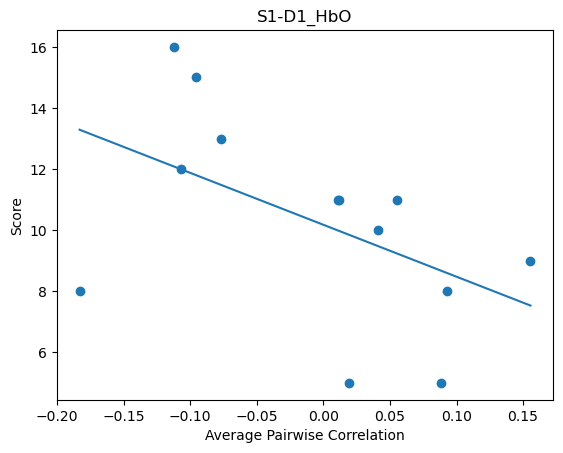

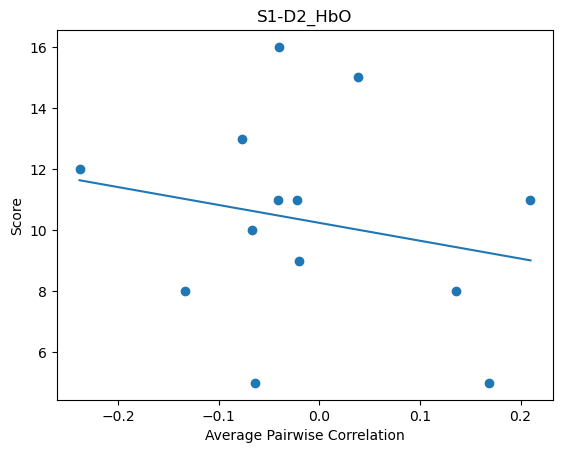

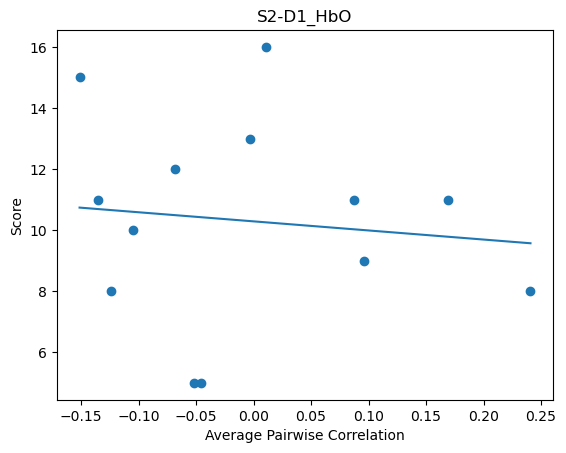

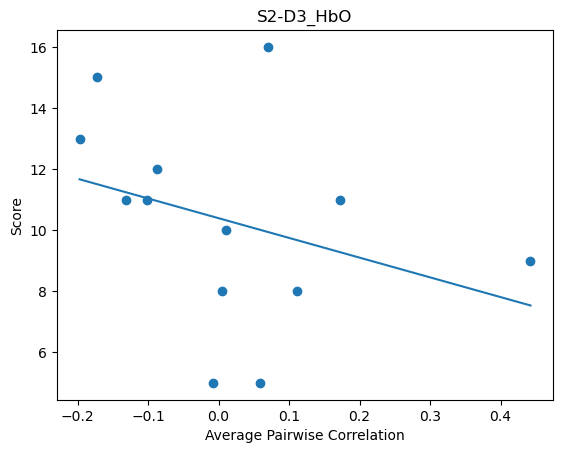

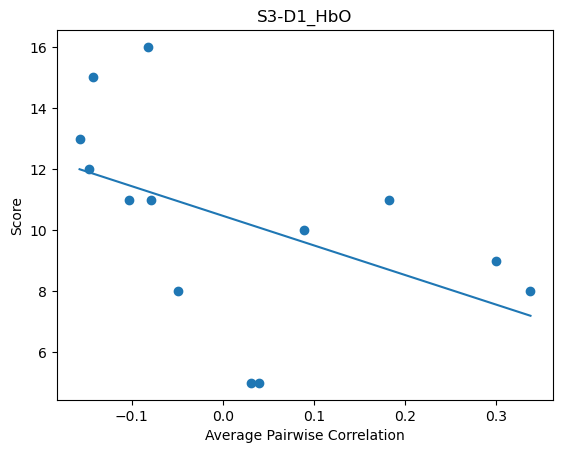

...

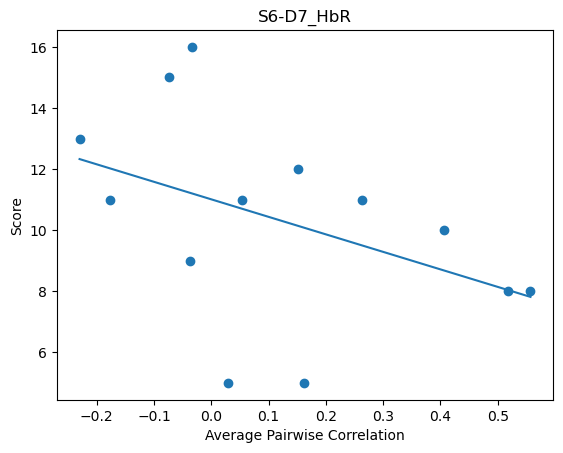

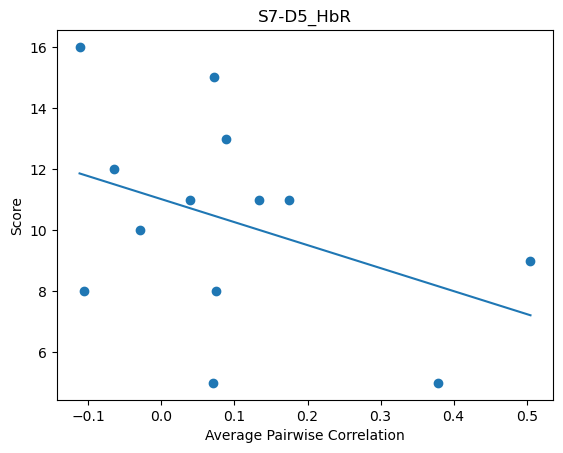

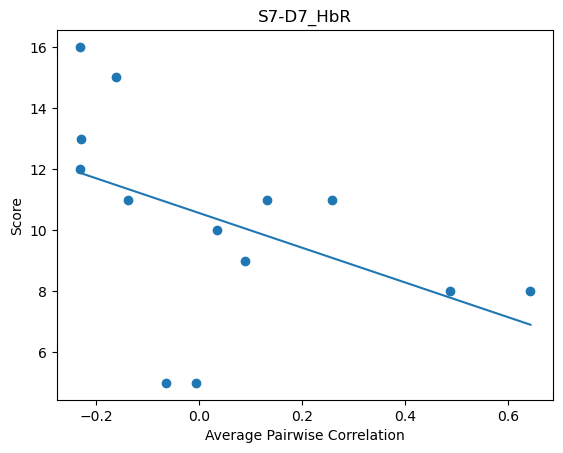

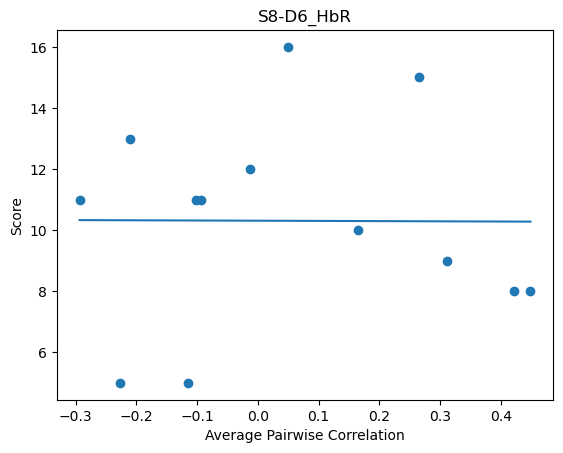

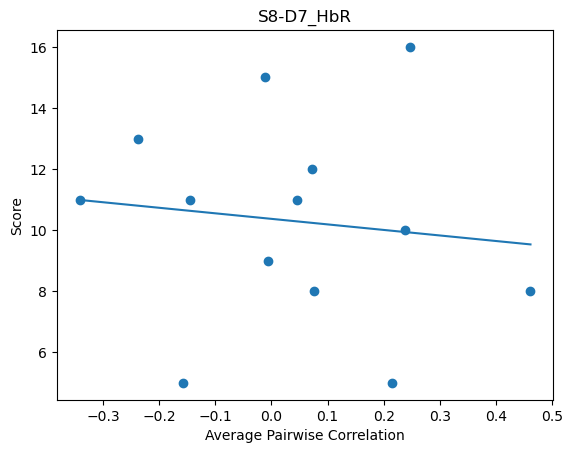

In [7]:
nirs_target_file = "ping_pong_cooperative_physio_task.csv"
nirs_correlation_output_json = f"{nirs_correlation_output_dir}/ping_pong_cooperative_correlation.json"
nirs_correlation_output_csv = f"{nirs_correlation_output_dir}/ping_pong_cooperative_correlation.csv"
nirs_correlation_output_image = f"{nirs_image_output_dir}/ping_pong_cooperative"
if not os.path.exists(nirs_correlation_output_image):
    os.makedirs(nirs_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        nirs_physio_task_dir,
        nirs_target_file,
        "score_left",
        NIRS_CHANNELS,
        nirs_correlation_output_image,
        output_file_path=nirs_correlation_output_json,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(nirs_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

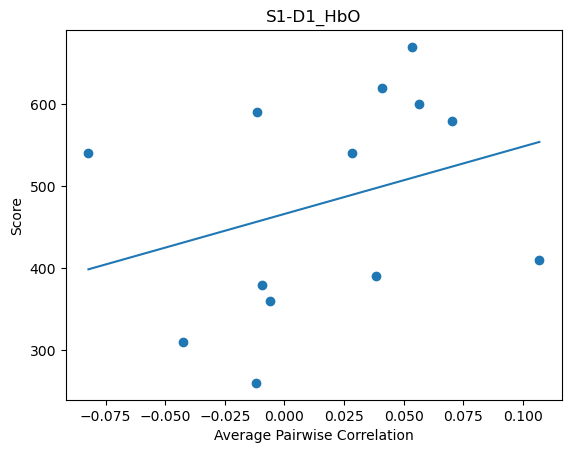

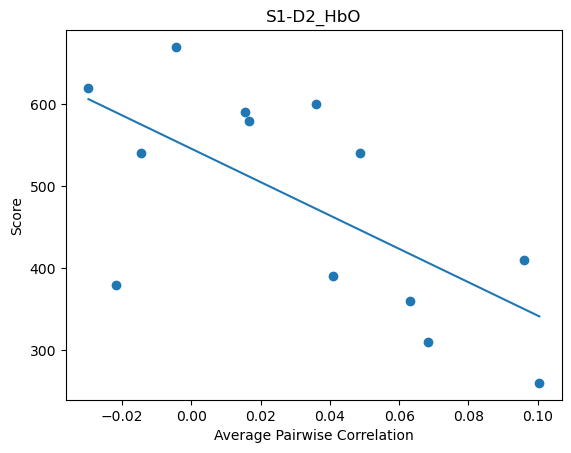

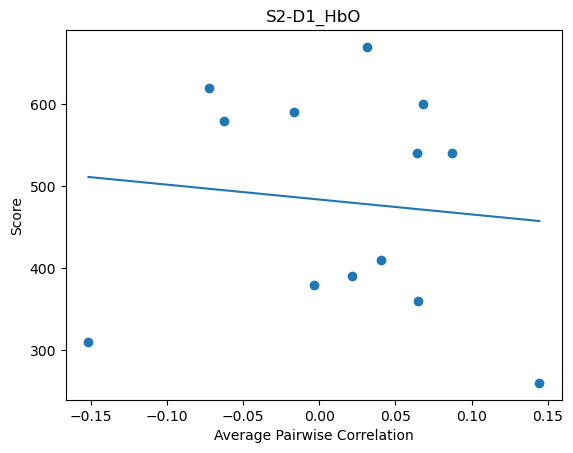

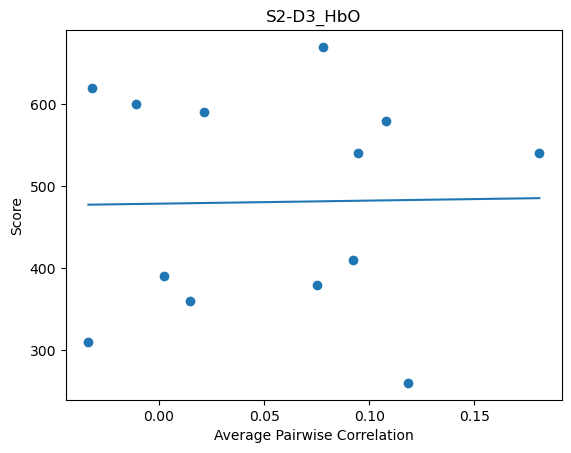

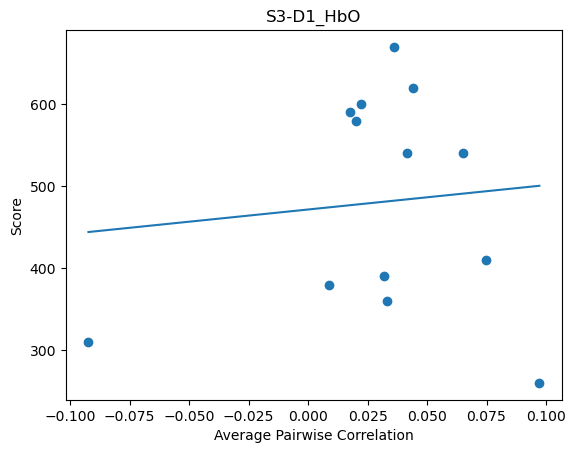

...

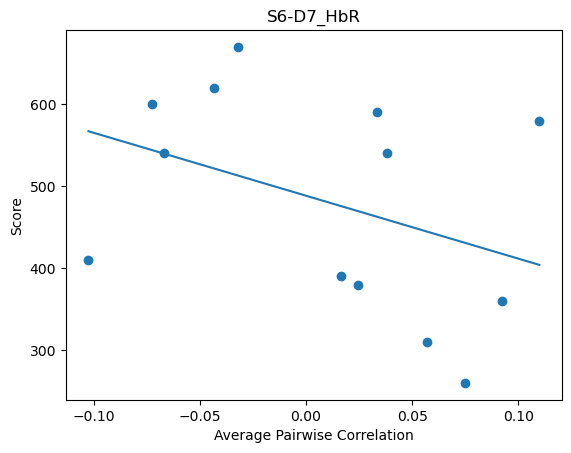

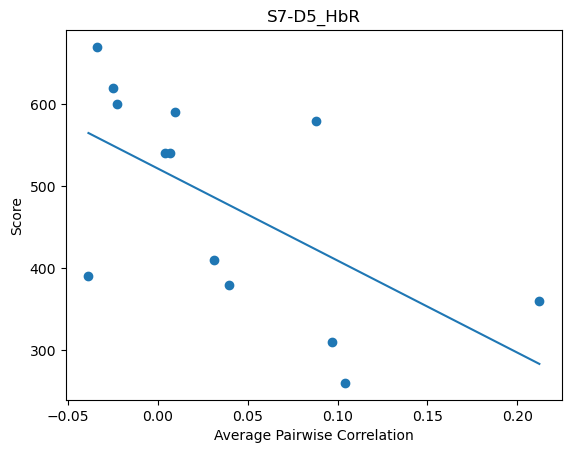

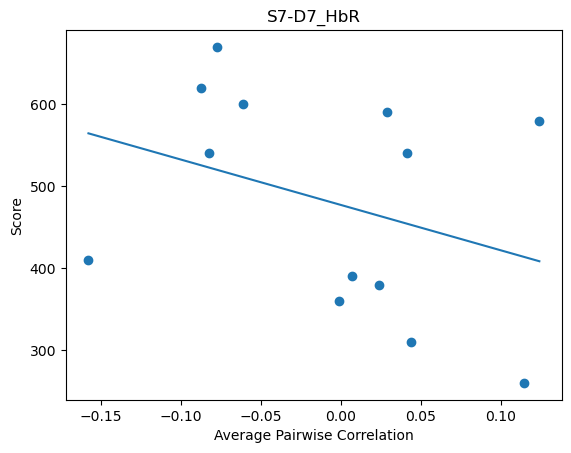

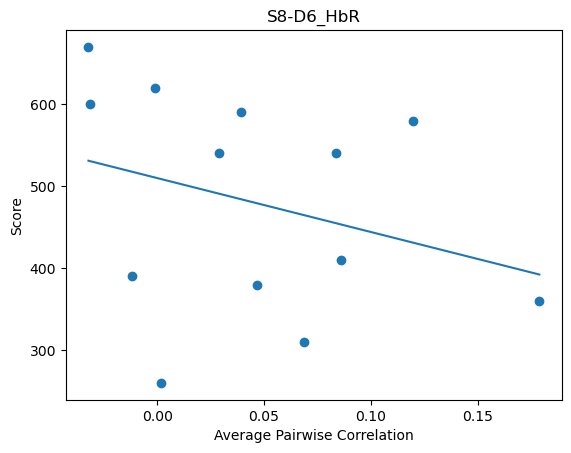

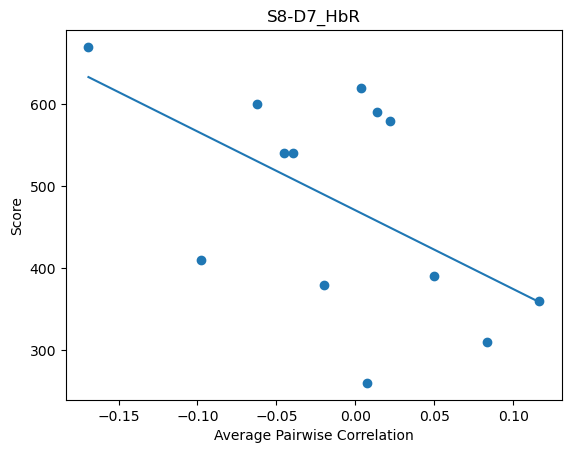

In [8]:
nirs_target_file = "minecraft_saturn_a_physio_task.csv"
nirs_correlation_output_json = f"{nirs_correlation_output_dir}/minecraft_saturn_a_correlation.json"
nirs_correlation_output_csv = f"{nirs_correlation_output_dir}/minecraft_saturn_a_correlation.csv"
nirs_correlation_output_image = f"{nirs_image_output_dir}/minecraft_saturn_a"
if not os.path.exists(nirs_correlation_output_image):
    os.makedirs(nirs_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        nirs_physio_task_dir,
        nirs_target_file,
        "score",
        NIRS_CHANNELS,
        nirs_correlation_output_image,
        output_file_path=nirs_correlation_output_json,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(nirs_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

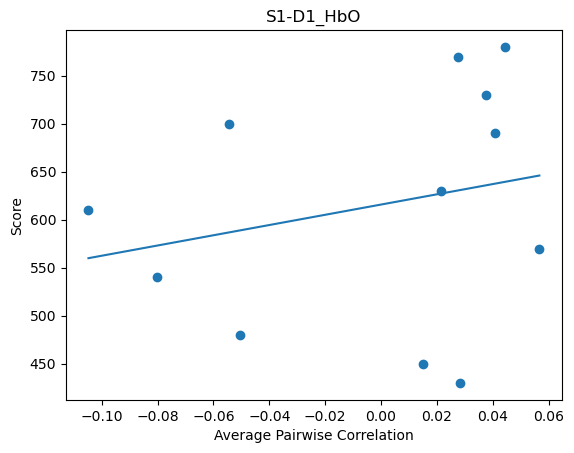

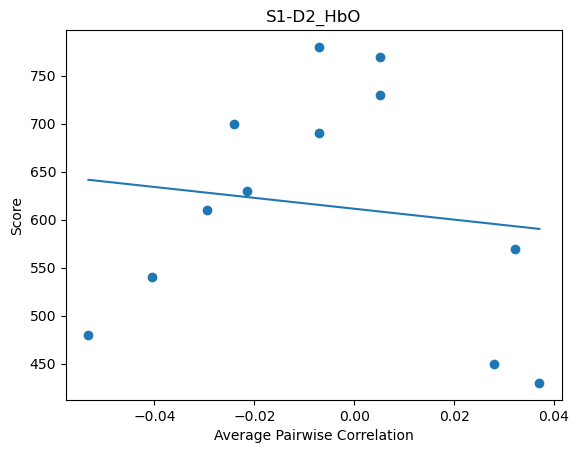

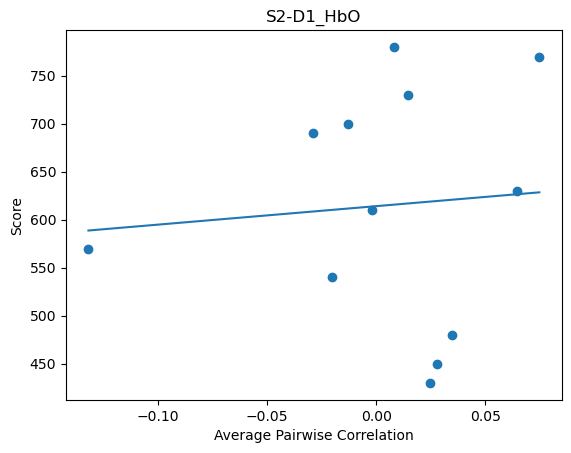

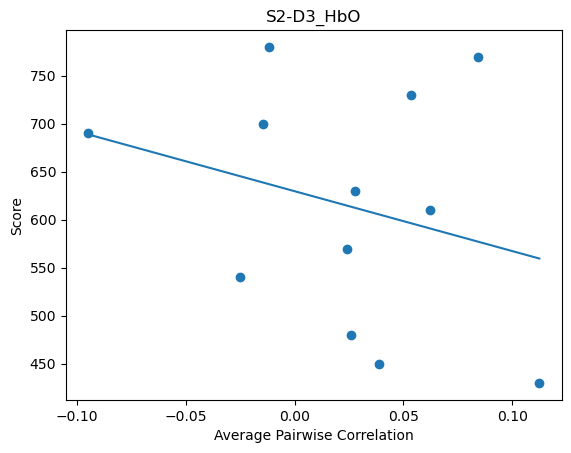

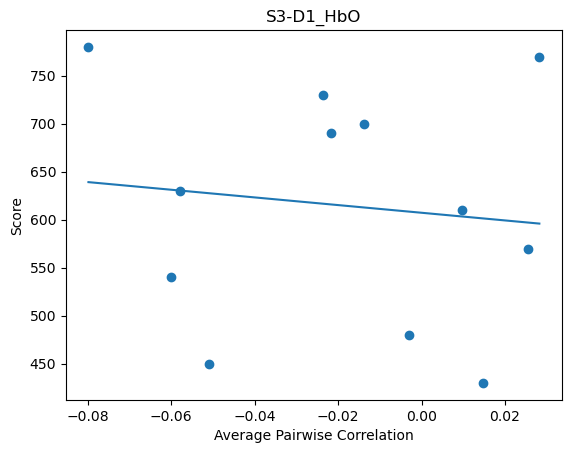

...

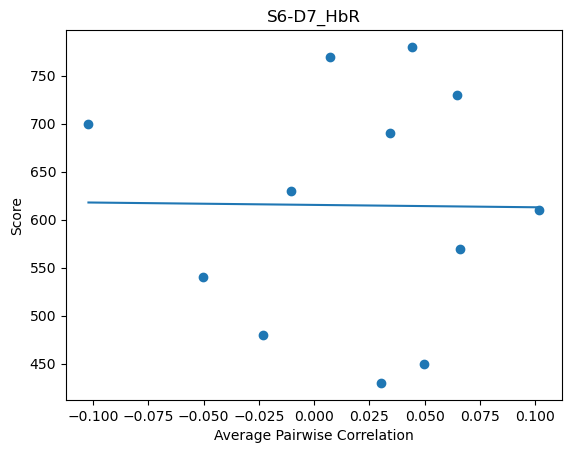

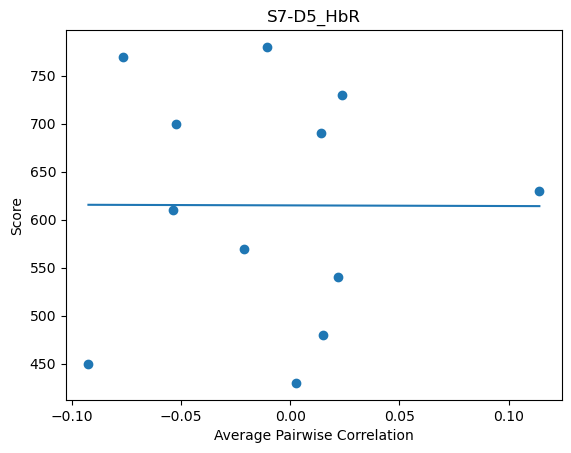

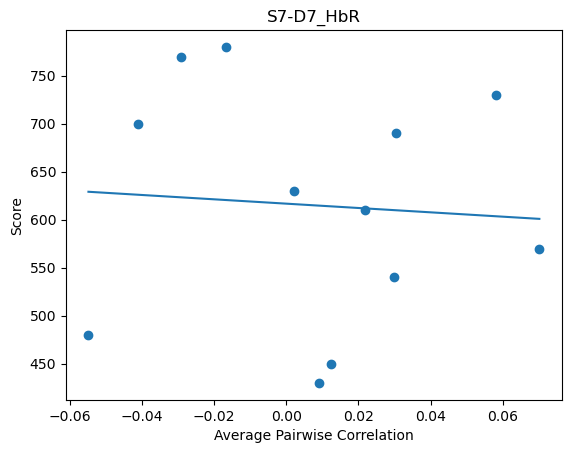

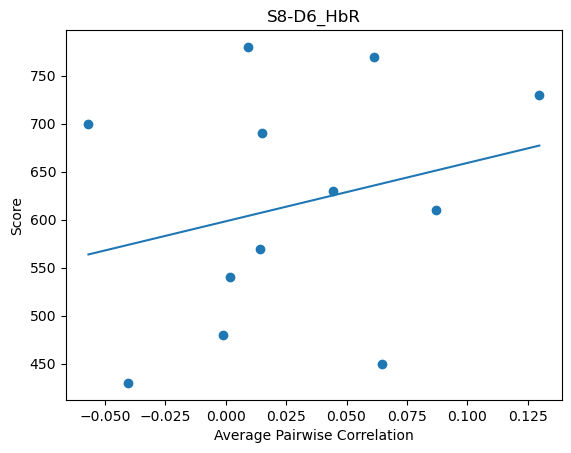

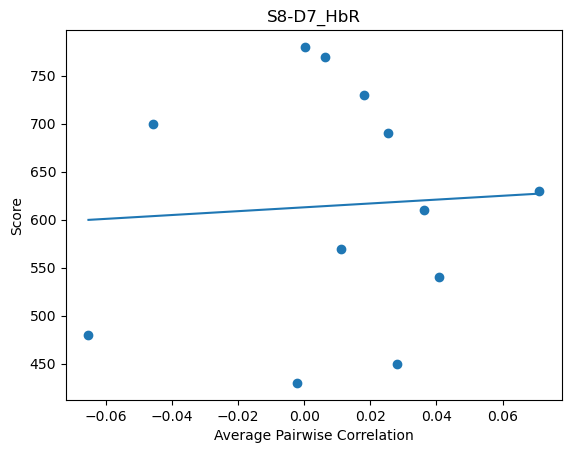

In [9]:
nirs_target_file = "minecraft_saturn_b_physio_task.csv"
nirs_correlation_output_json = f"{nirs_correlation_output_dir}/minecraft_saturn_b_correlation.json"
nirs_correlation_output_csv = f"{nirs_correlation_output_dir}/minecraft_saturn_b_correlation.csv"
nirs_correlation_output_image = f"{nirs_image_output_dir}/minecraft_saturn_b"
if not os.path.exists(nirs_correlation_output_image):
    os.makedirs(nirs_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        nirs_physio_task_dir,
        nirs_target_file,
        "score",
        NIRS_CHANNELS,
        nirs_correlation_output_image,
        output_file_path=nirs_correlation_output_json,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(nirs_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

# EEG

/Users/ericduong/miniforge3/envs/tomcat-data-draft/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4461: NearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(stats.NearConstantInputWarning(msg))


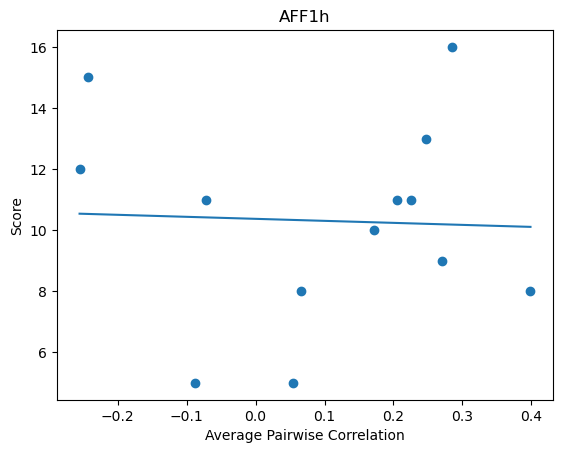

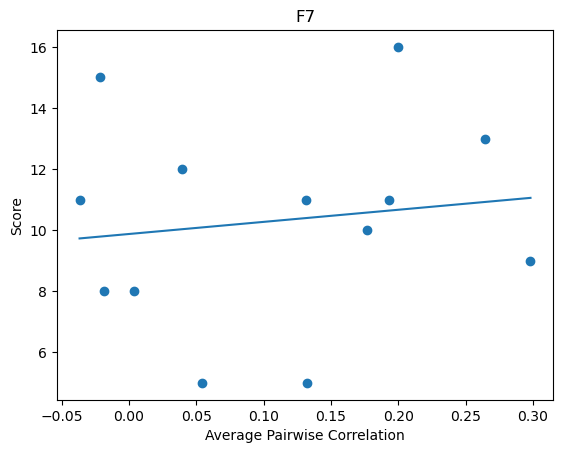

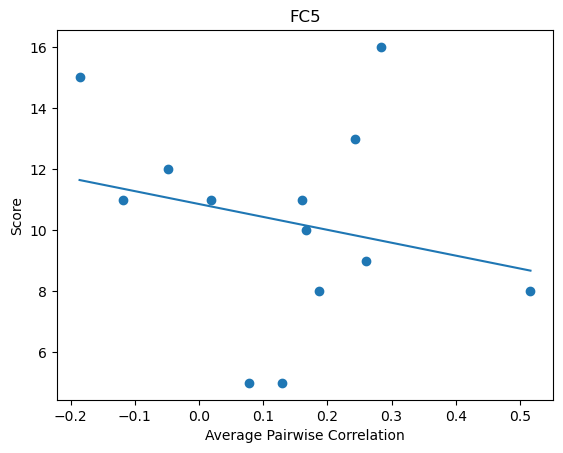

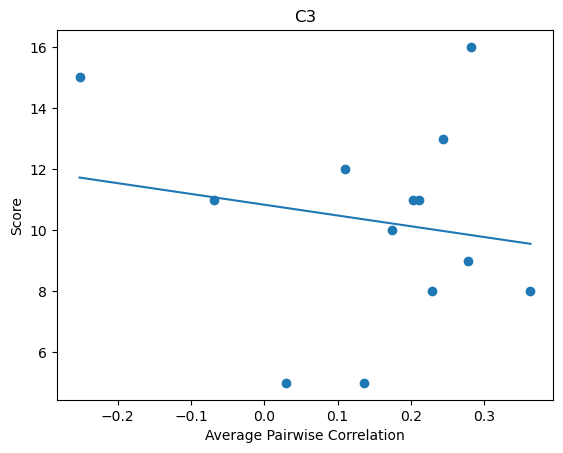

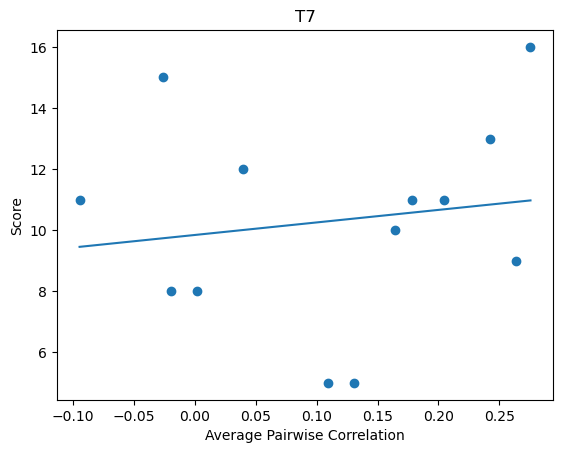

...

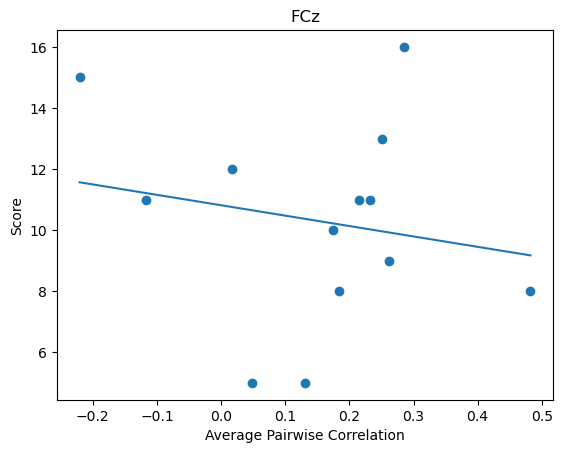

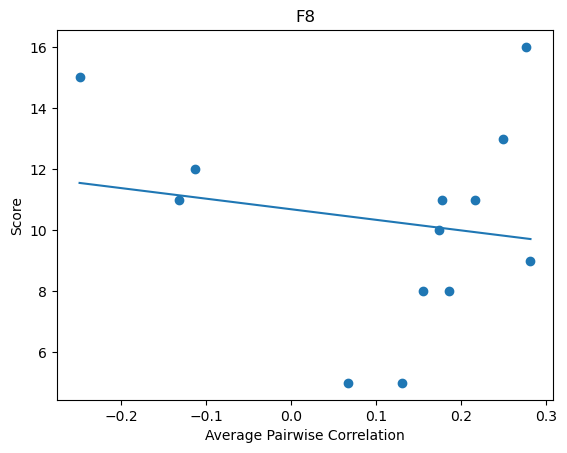

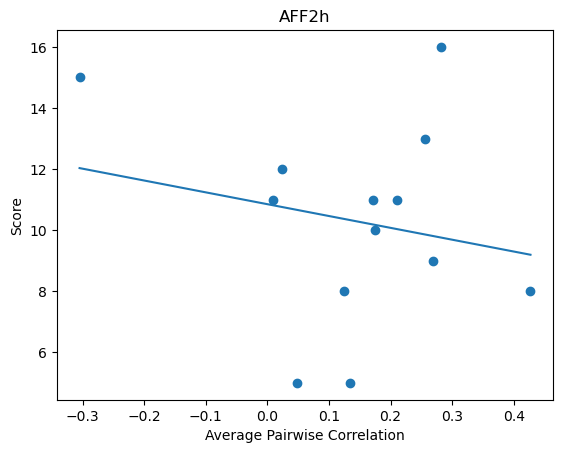

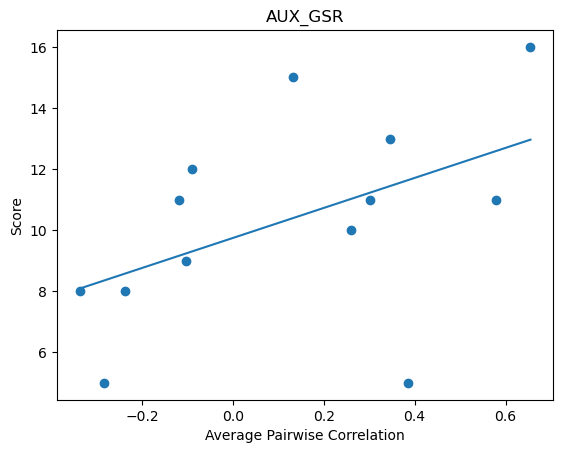

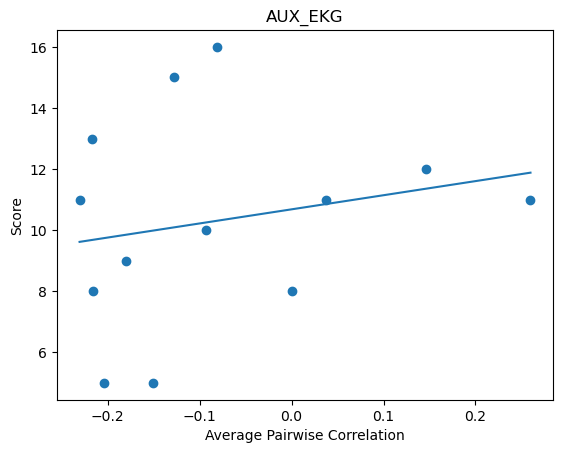

In [10]:
eeg_target_file = "ping_pong_cooperative_physio_task.csv"
eeg_correlation_output_json = f"{eeg_correlation_output_dir}/ping_pong_cooperative_correlation.json"
eeg_correlation_output_csv = f"{eeg_correlation_output_dir}/ping_pong_cooperative_correlation.csv"
eeg_correlation_output_image = f"{eeg_image_output_dir}/ping_pong_cooperative"
if not os.path.exists(eeg_correlation_output_image):
    os.makedirs(eeg_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        eeg_physio_task_dir,
        eeg_target_file,
        "score_left",
        EEG_CHANNELS,
        eeg_correlation_output_image,
        output_file_path=eeg_correlation_output_json,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(eeg_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

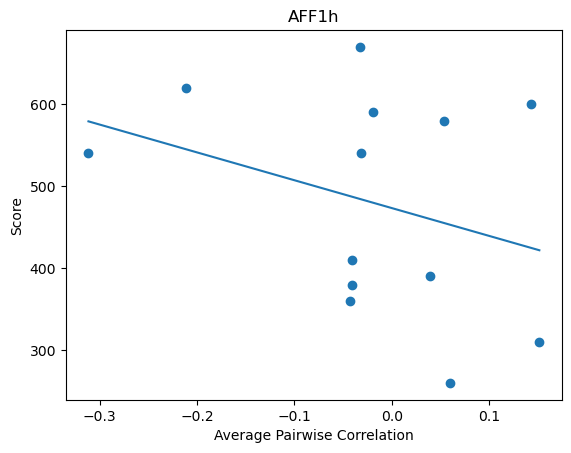

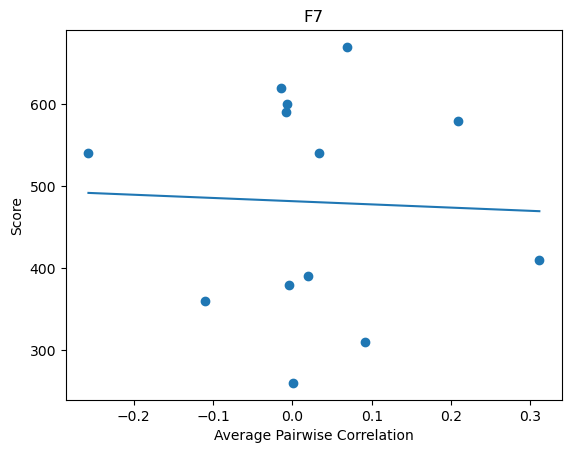

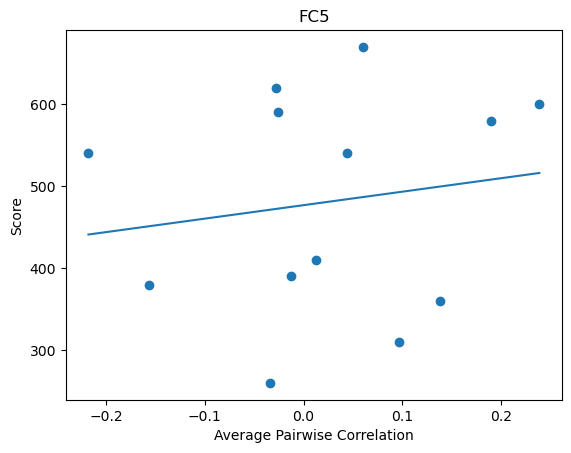

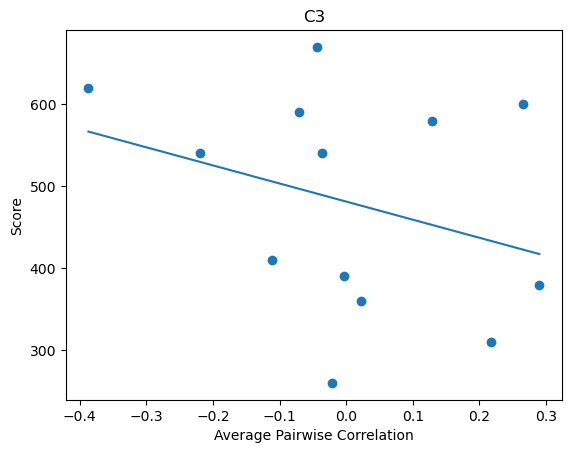

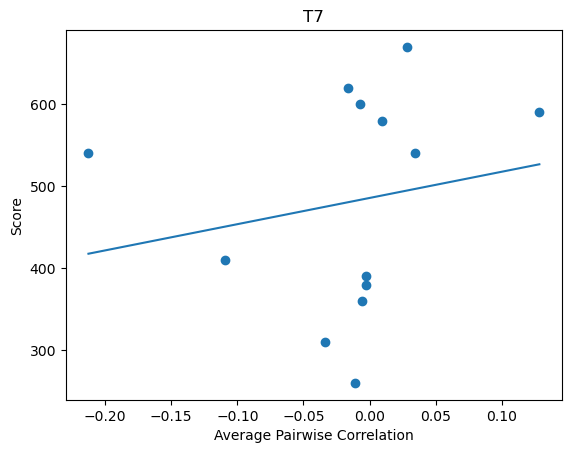

...

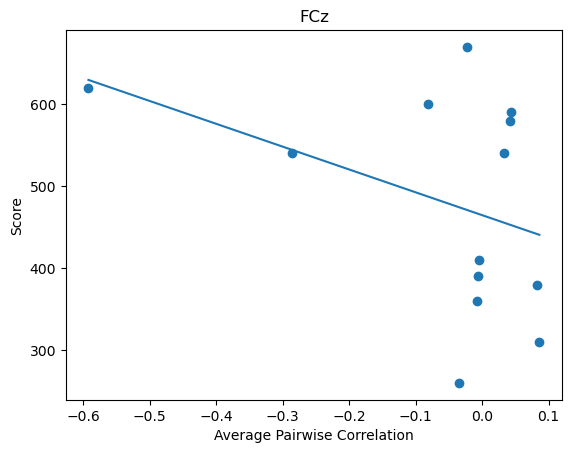

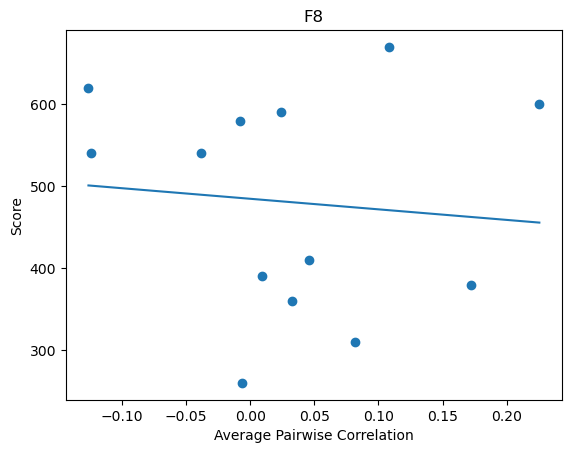

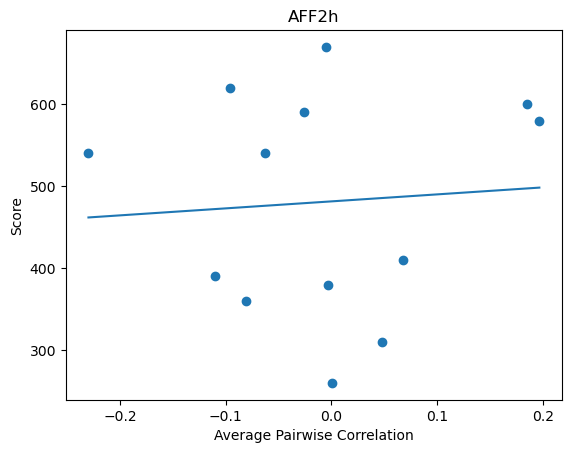

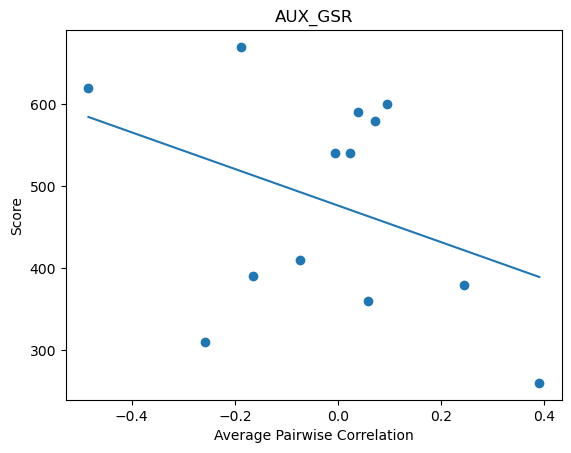

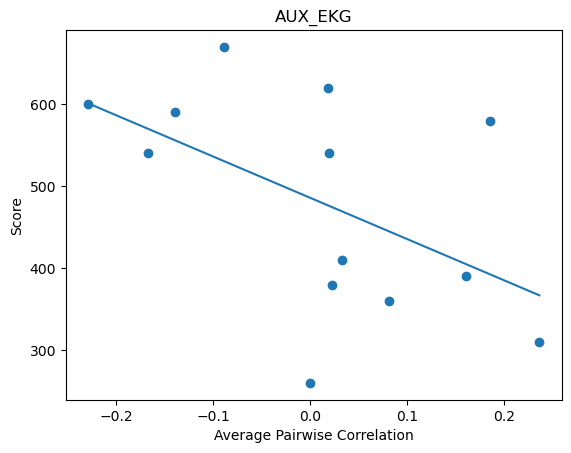

In [11]:
eeg_target_file = "minecraft_saturn_a_physio_task.csv"
eeg_correlation_output_json = f"{eeg_correlation_output_dir}/minecraft_saturn_a_correlation.json"
eeg_correlation_output_csv = f"{eeg_correlation_output_dir}/minecraft_saturn_a_correlation.csv"
eeg_correlation_output_image = f"{eeg_image_output_dir}/minecraft_saturn_a"
if not os.path.exists(eeg_correlation_output_image):
    os.makedirs(eeg_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        eeg_physio_task_dir,
        eeg_target_file,
        "score",
        EEG_CHANNELS,
        eeg_correlation_output_image,
        output_file_path=eeg_correlation_output_json,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(eeg_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

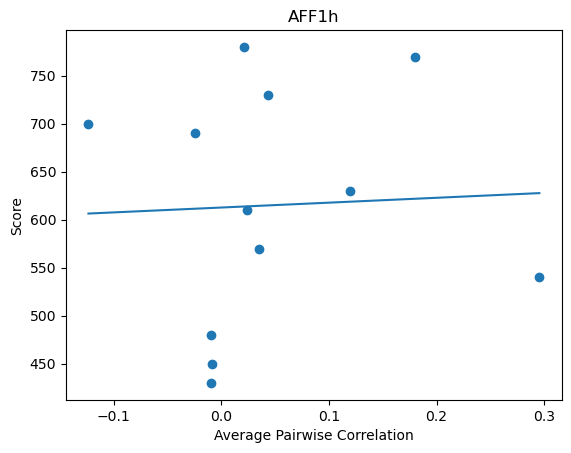

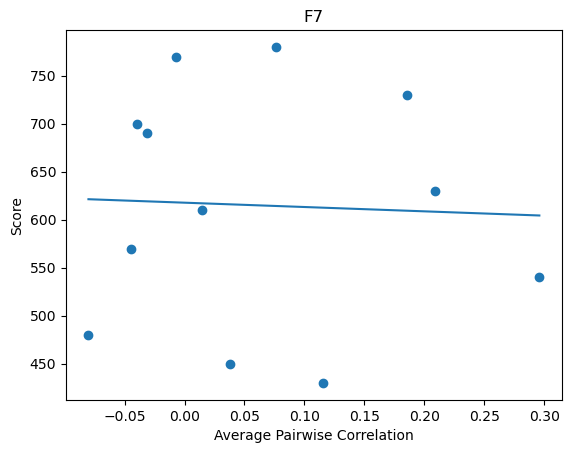

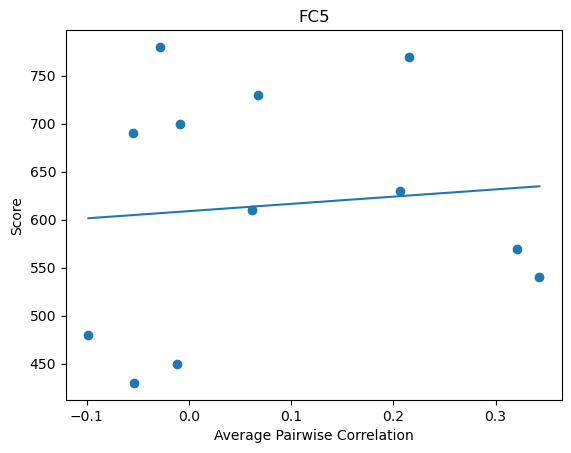

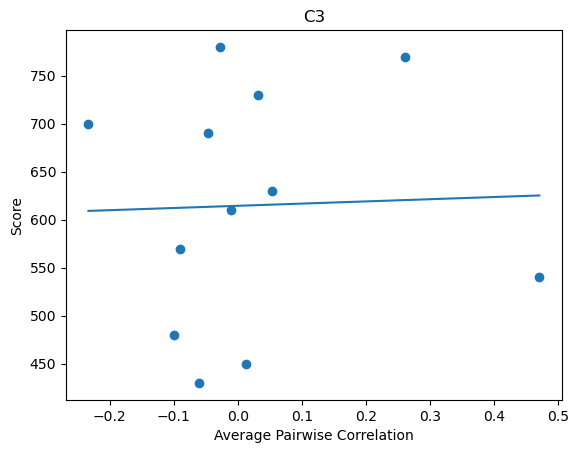

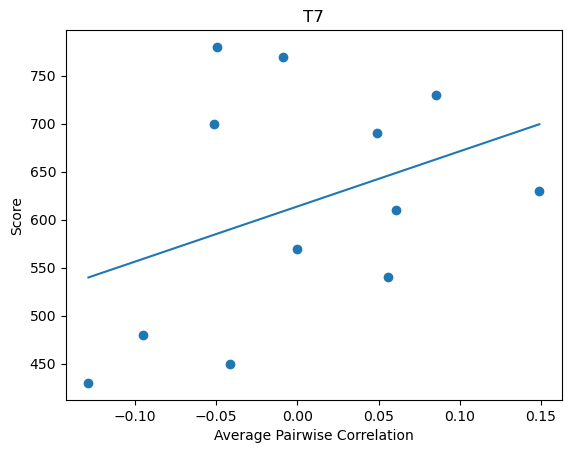

...

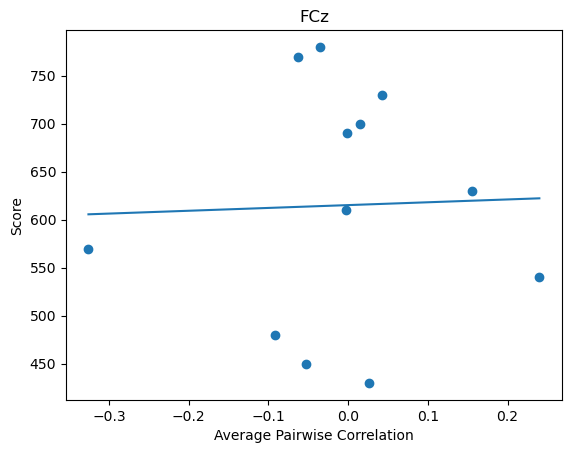

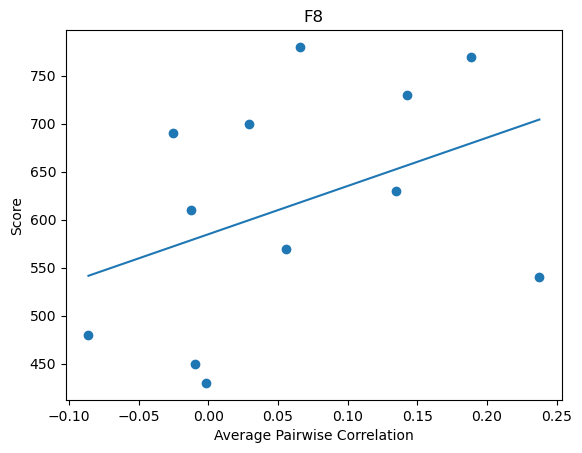

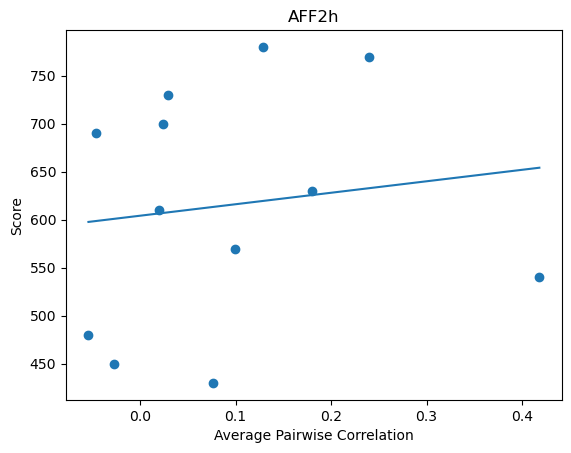

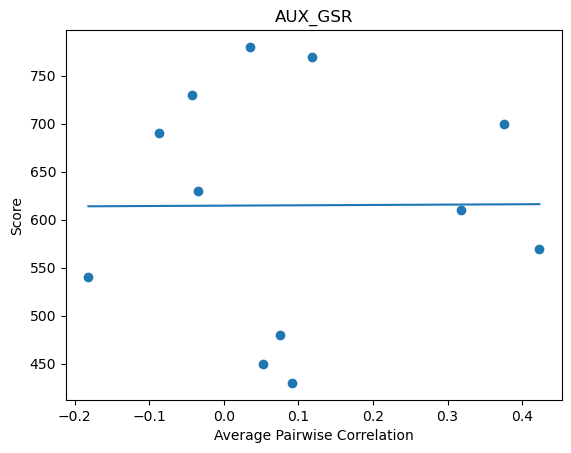

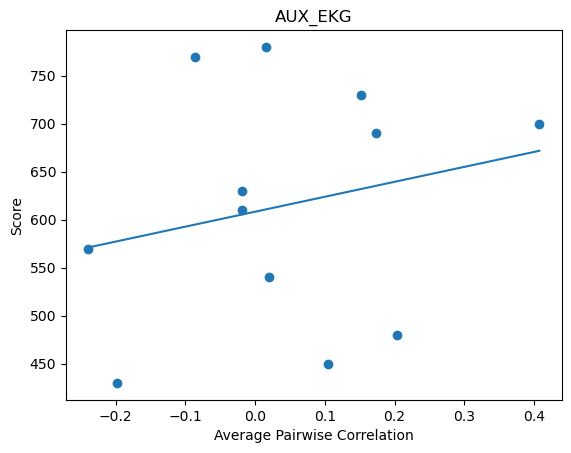

In [12]:
eeg_target_file = "minecraft_saturn_b_physio_task.csv"
eeg_correlation_output_json = f"{eeg_correlation_output_dir}/minecraft_saturn_b_correlation.json"
eeg_correlation_output_csv = f"{eeg_correlation_output_dir}/minecraft_saturn_b_correlation.csv"
eeg_correlation_output_image = f"{eeg_image_output_dir}/minecraft_saturn_b"
if not os.path.exists(eeg_correlation_output_image):
    os.makedirs(eeg_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        eeg_physio_task_dir,
        eeg_target_file,
        "score",
        EEG_CHANNELS,
        eeg_correlation_output_image,
        output_file_path=eeg_correlation_output_json,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(eeg_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

# NIRS Absolute Value

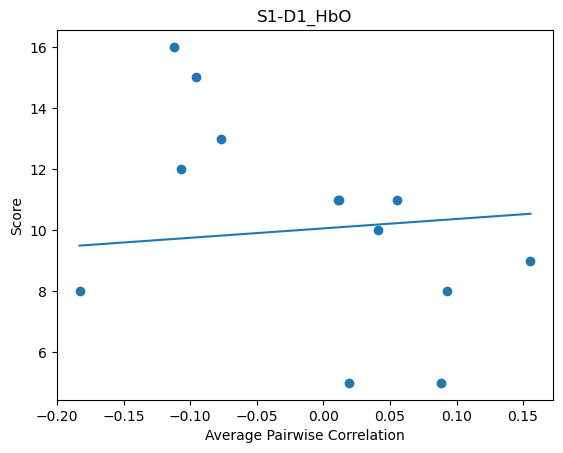

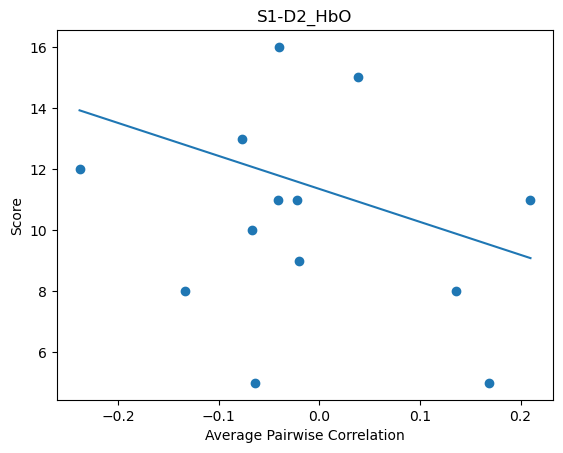

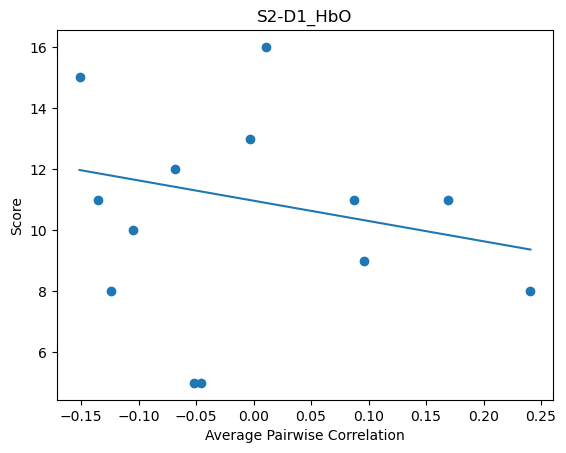

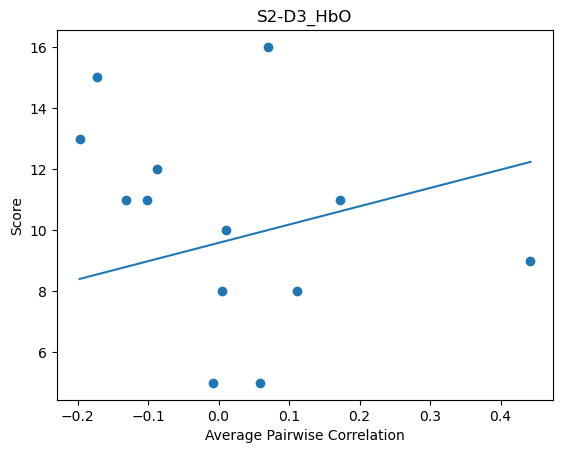

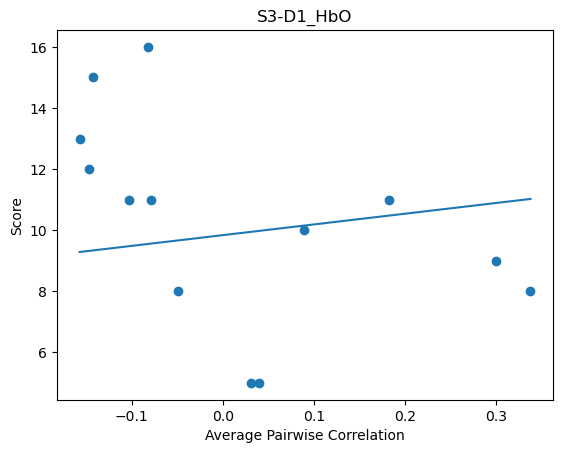

...

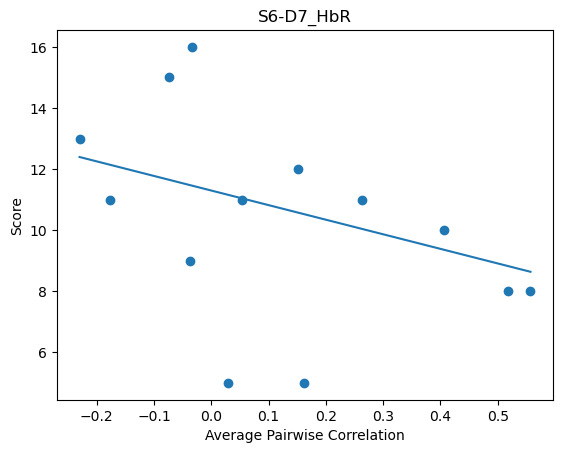

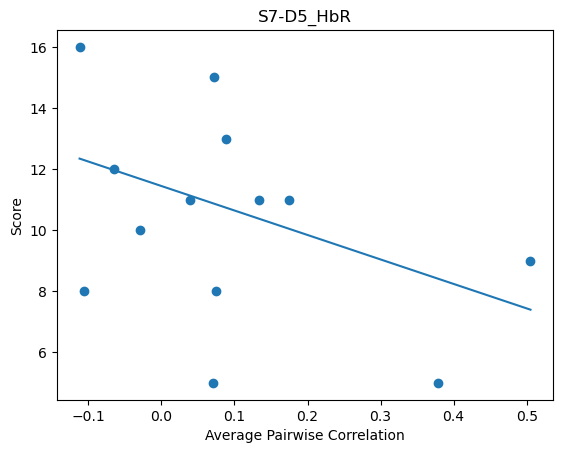

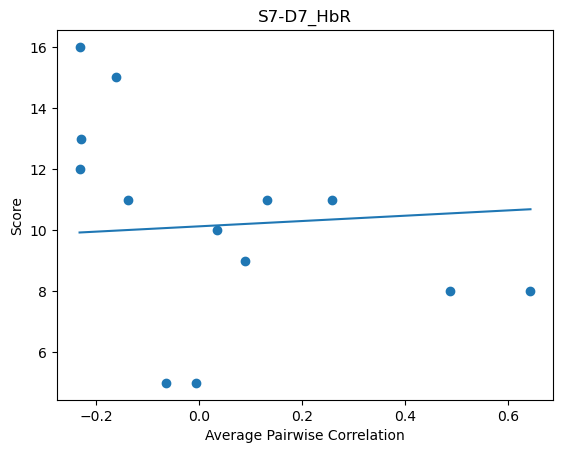

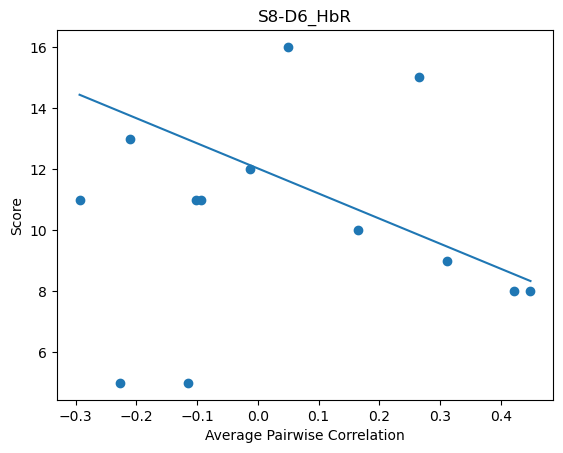

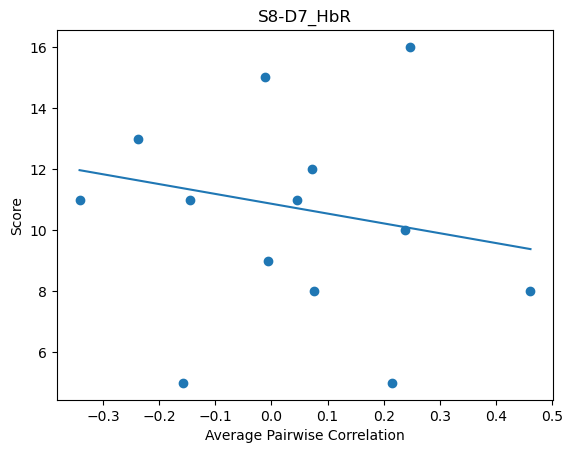

In [13]:
nirs_target_file = "ping_pong_cooperative_physio_task.csv"
nirs_correlation_output_json = f"{nirs_correlation_output_dir}/ping_pong_cooperative_correlation_absolute.json"
nirs_correlation_output_csv = f"{nirs_correlation_output_dir}/ping_pong_cooperative_correlation_absolute.csv"
nirs_correlation_output_image = f"{nirs_image_output_dir}/ping_pong_cooperative_absolute"
if not os.path.exists(nirs_correlation_output_image):
    os.makedirs(nirs_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        nirs_physio_task_dir,
        nirs_target_file,
        "score_left",
        NIRS_CHANNELS,
        nirs_correlation_output_image,
        output_file_path=nirs_correlation_output_json,
        absolute_value_correlations=True,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(nirs_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

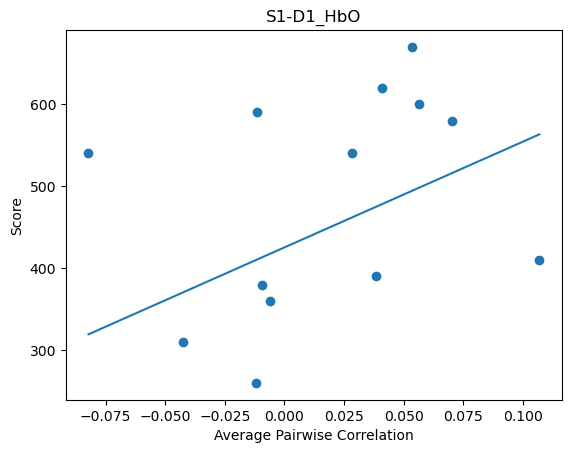

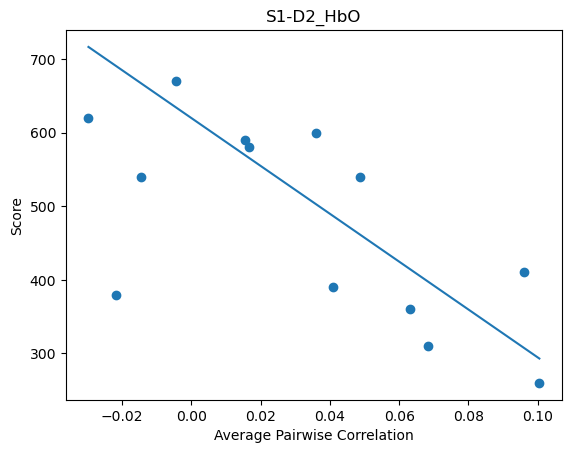

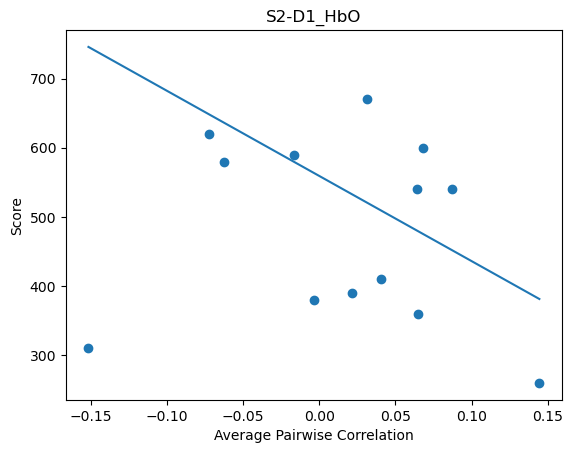

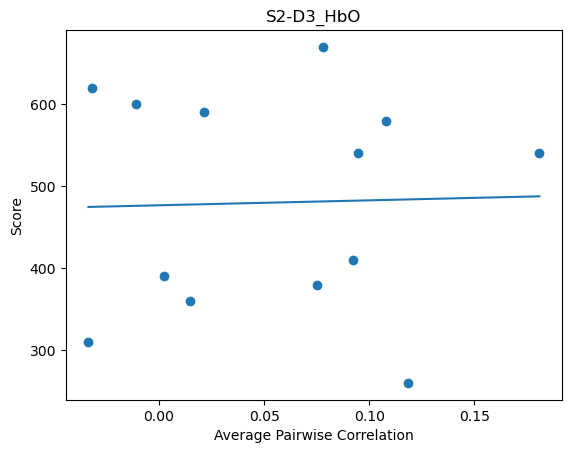

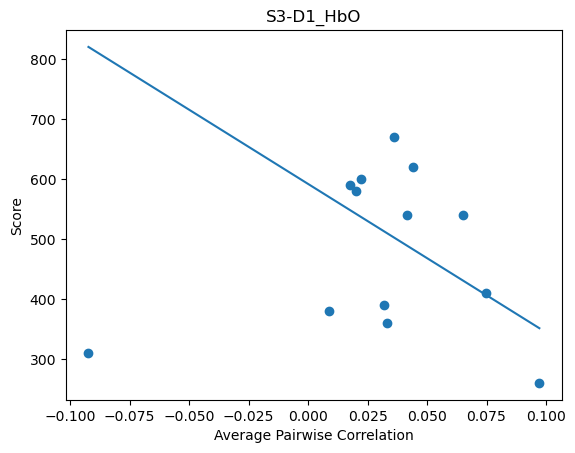

...

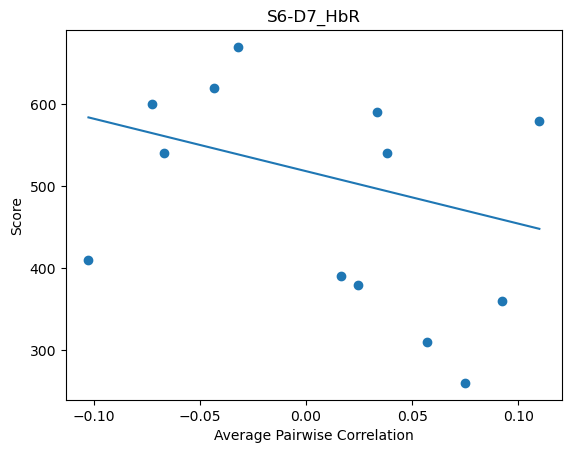

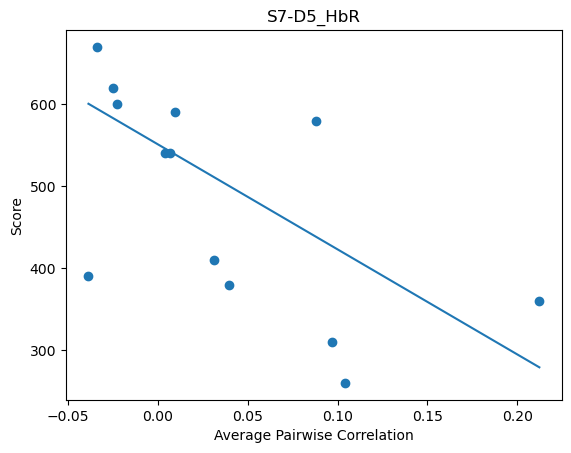

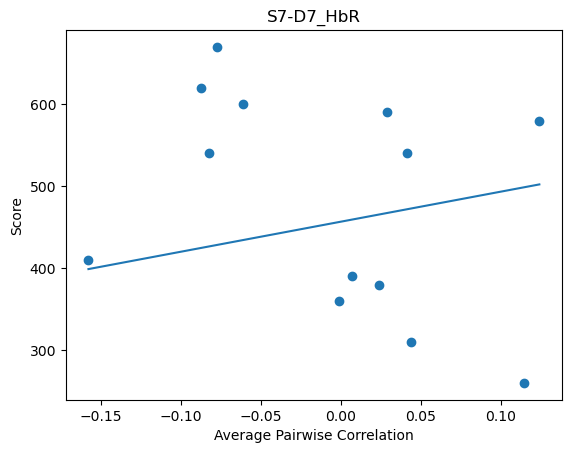

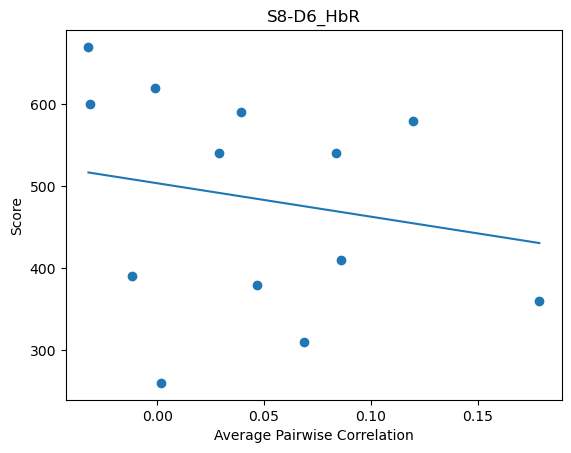

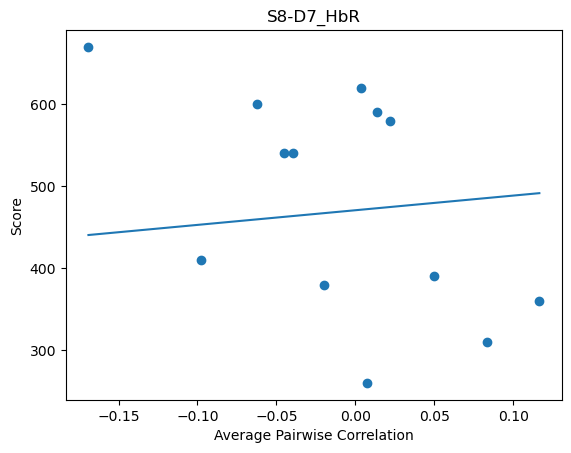

In [14]:
nirs_target_file = "minecraft_saturn_a_physio_task.csv"
nirs_correlation_output_json = f"{nirs_correlation_output_dir}/minecraft_saturn_a_correlation_absolute.json"
nirs_correlation_output_csv = f"{nirs_correlation_output_dir}/minecraft_saturn_a_correlation_absolute.csv"
nirs_correlation_output_image = f"{nirs_image_output_dir}/minecraft_saturn_a_absolute"
if not os.path.exists(nirs_correlation_output_image):
    os.makedirs(nirs_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        nirs_physio_task_dir,
        nirs_target_file,
        "score",
        NIRS_CHANNELS,
        nirs_correlation_output_image,
        output_file_path=nirs_correlation_output_json,
        absolute_value_correlations=True,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(nirs_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

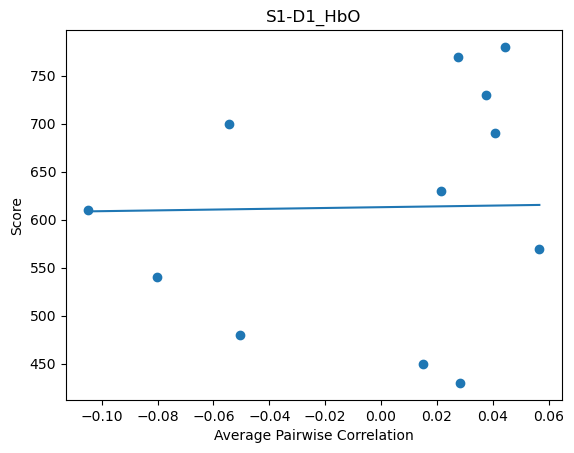

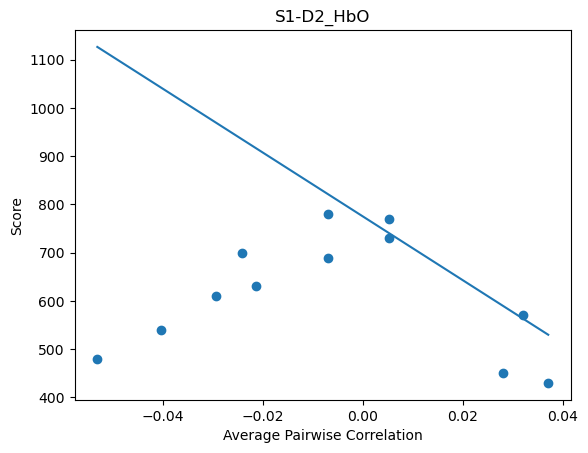

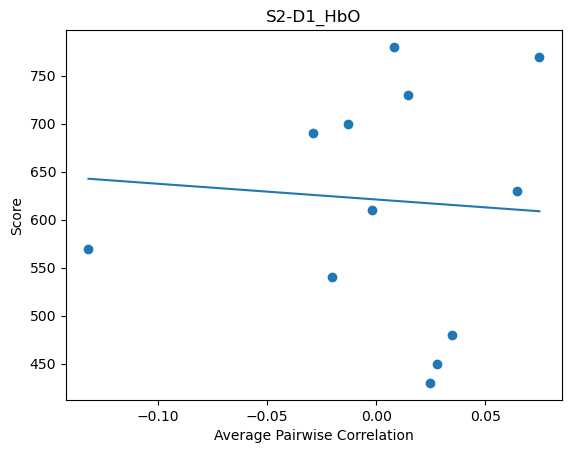

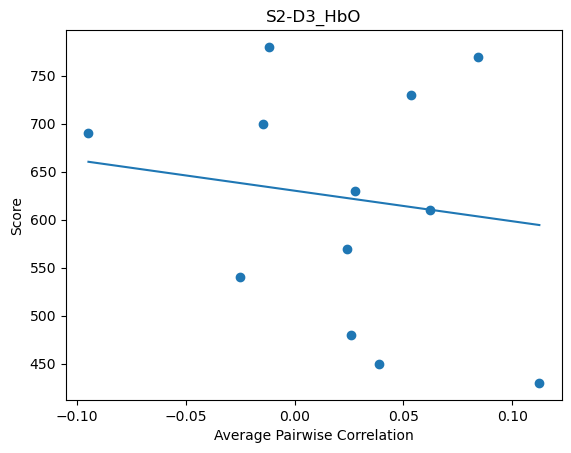

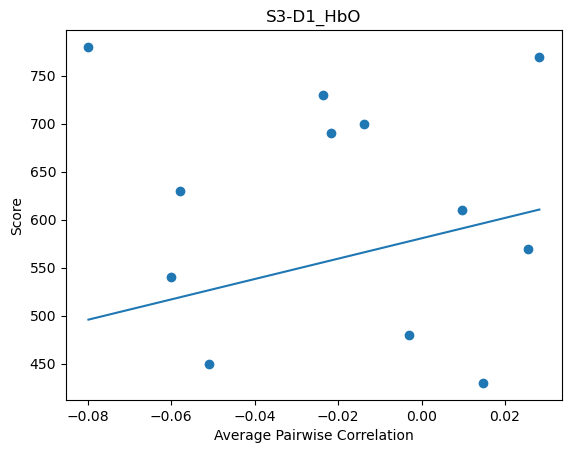

...

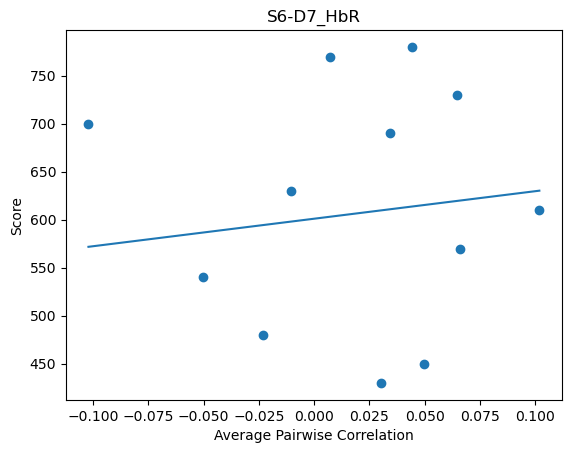

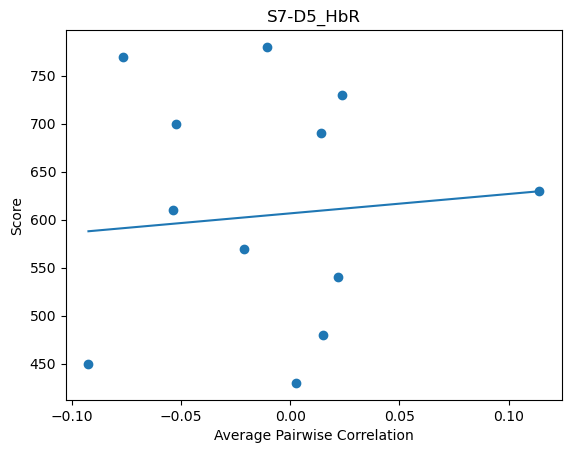

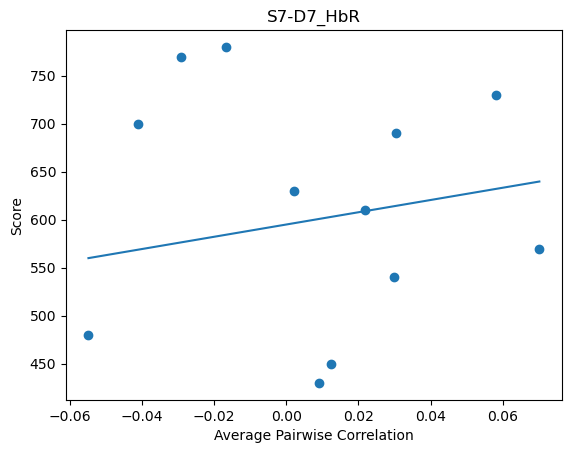

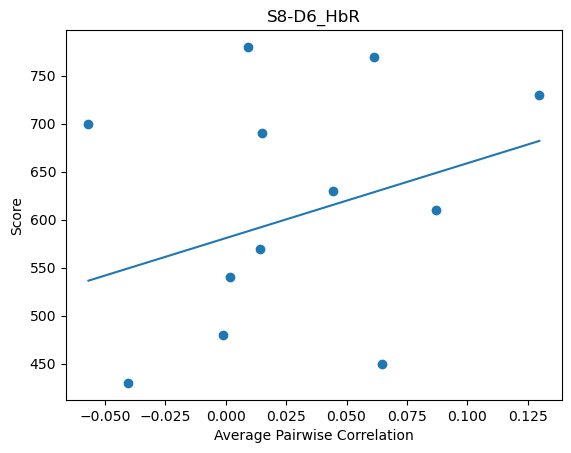

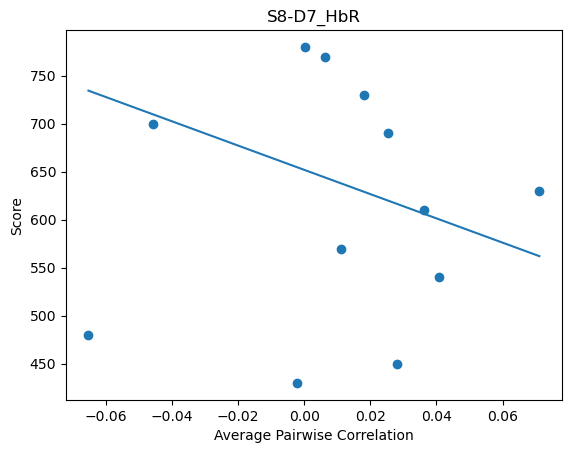

In [15]:
nirs_target_file = "minecraft_saturn_b_physio_task.csv"
nirs_correlation_output_json = f"{nirs_correlation_output_dir}/minecraft_saturn_b_correlation_absolute.json"
nirs_correlation_output_csv = f"{nirs_correlation_output_dir}/minecraft_saturn_b_correlation_absolute.csv"
nirs_correlation_output_image = f"{nirs_image_output_dir}/minecraft_saturn_b_absolute"
if not os.path.exists(nirs_correlation_output_image):
    os.makedirs(nirs_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        nirs_physio_task_dir,
        nirs_target_file,
        "score",
        NIRS_CHANNELS,
        nirs_correlation_output_image,
        output_file_path=nirs_correlation_output_json,
        absolute_value_correlations=True,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(nirs_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

# EEG Absolute Value

/Users/ericduong/miniforge3/envs/tomcat-data-draft/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4461: NearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(stats.NearConstantInputWarning(msg))


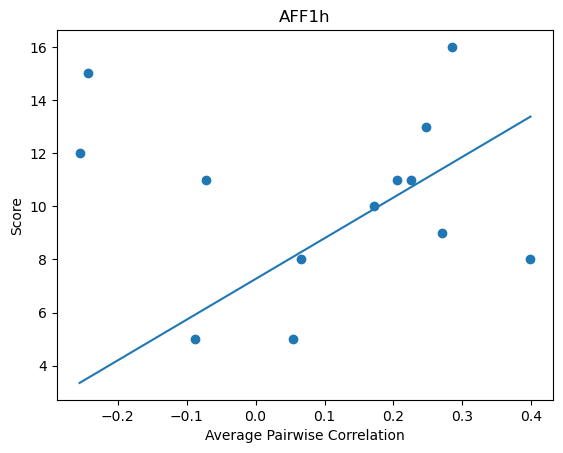

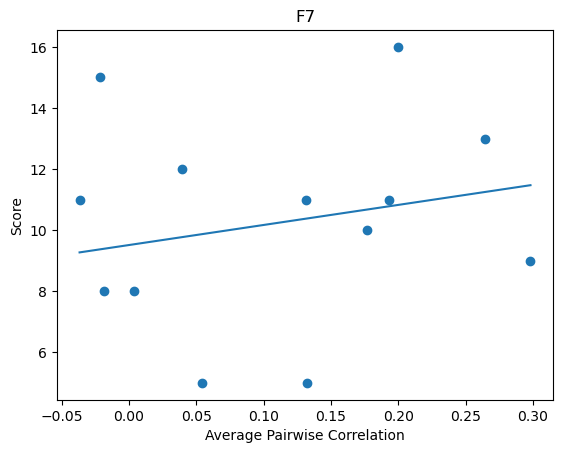

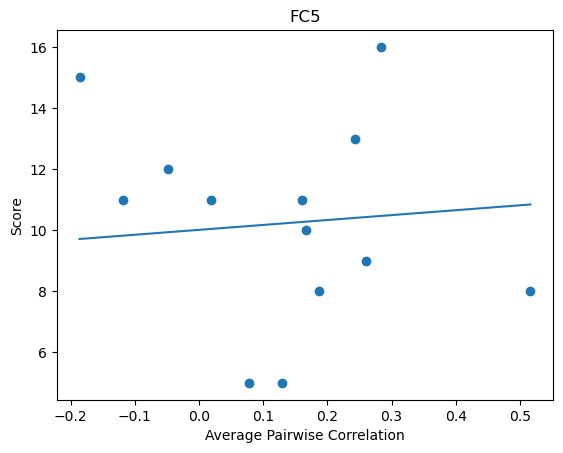

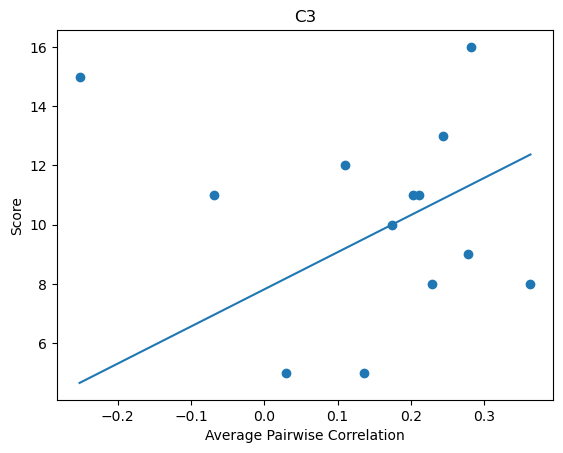

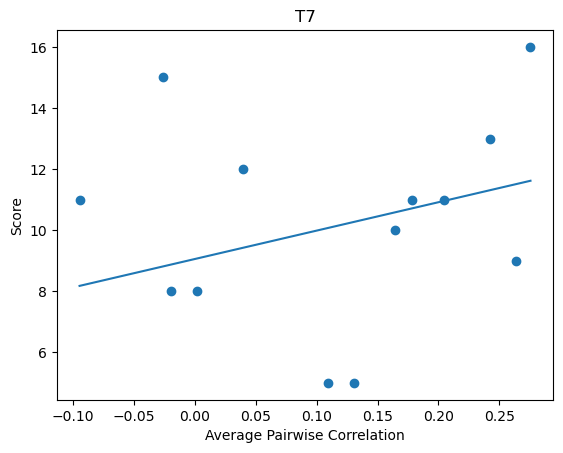

...

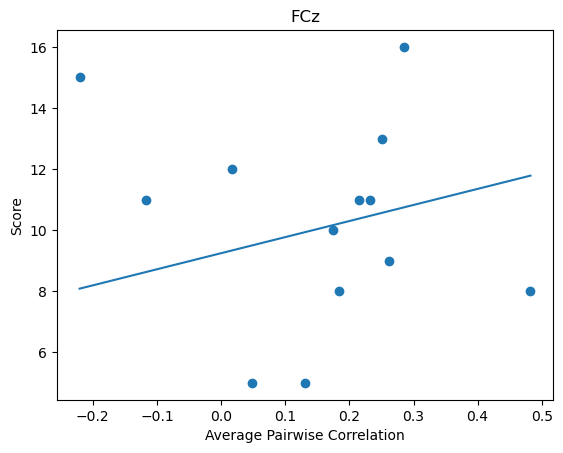

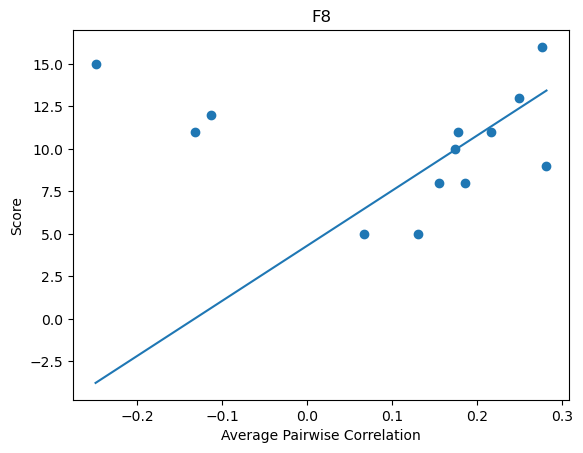

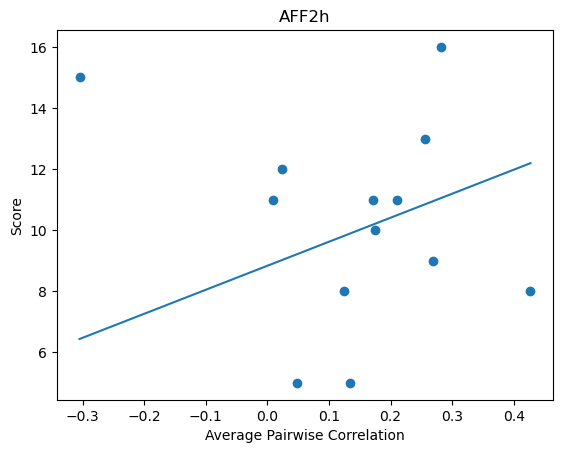

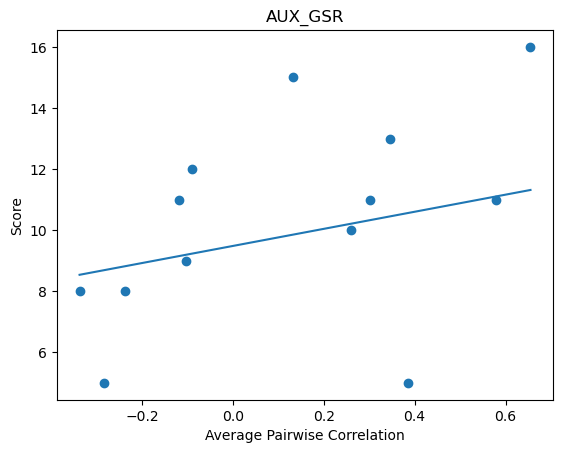

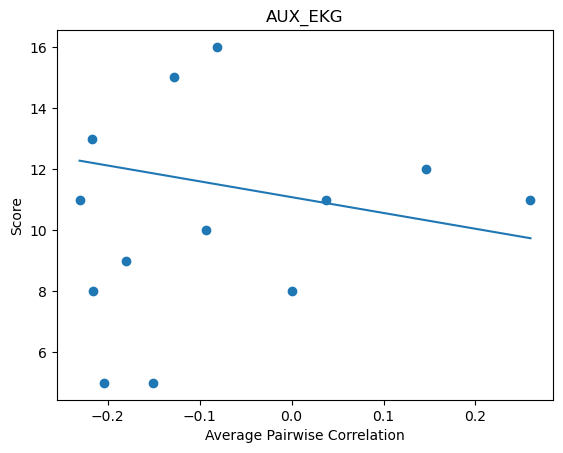

In [16]:
eeg_target_file = "ping_pong_cooperative_physio_task.csv"
eeg_correlation_output_json = f"{eeg_correlation_output_dir}/ping_pong_cooperative_correlation_absolute.json"
eeg_correlation_output_csv = f"{eeg_correlation_output_dir}/ping_pong_cooperative_correlation_absolute.csv"
eeg_correlation_output_image = f"{eeg_image_output_dir}/ping_pong_cooperative_absolute"
if not os.path.exists(eeg_correlation_output_image):
    os.makedirs(eeg_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        eeg_physio_task_dir,
        eeg_target_file,
        "score_left",
        EEG_CHANNELS,
        eeg_correlation_output_image,
        output_file_path=eeg_correlation_output_json,
        absolute_value_correlations=True,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(eeg_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

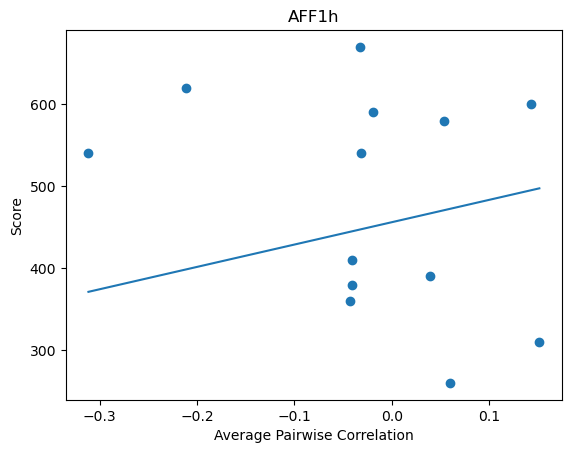

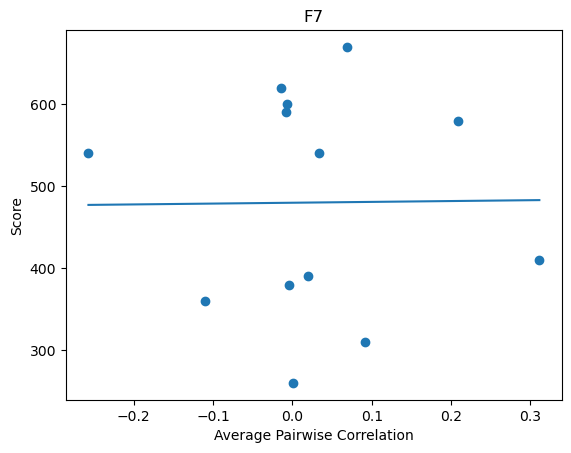

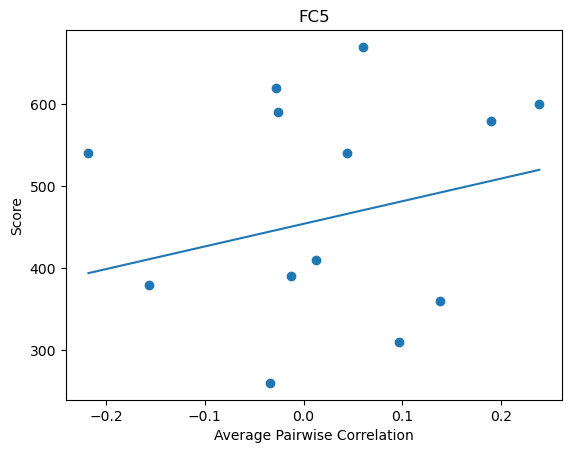

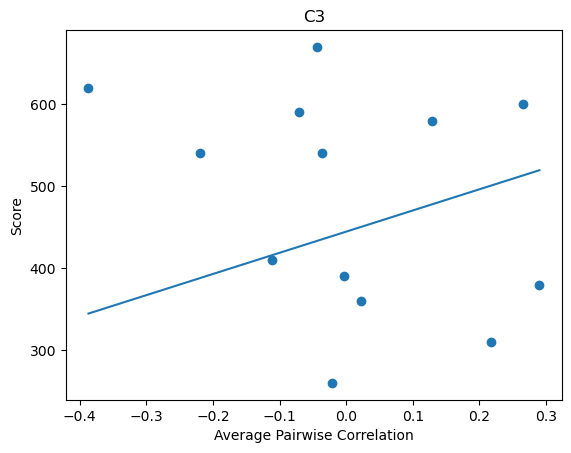

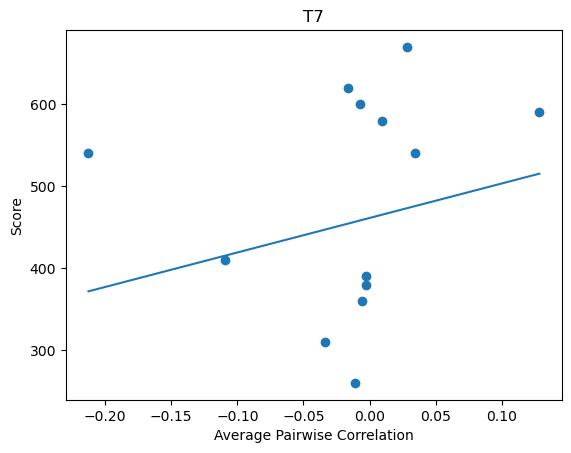

...

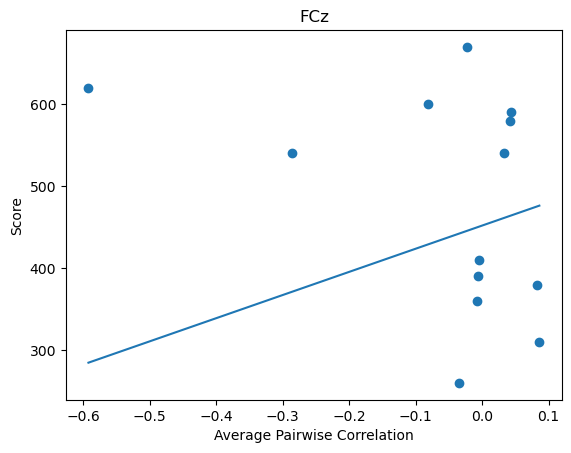

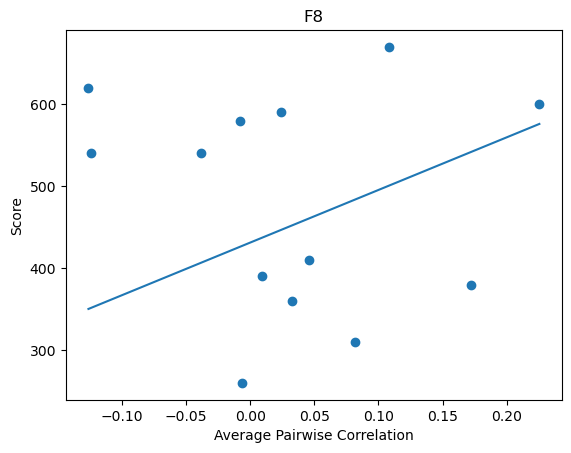

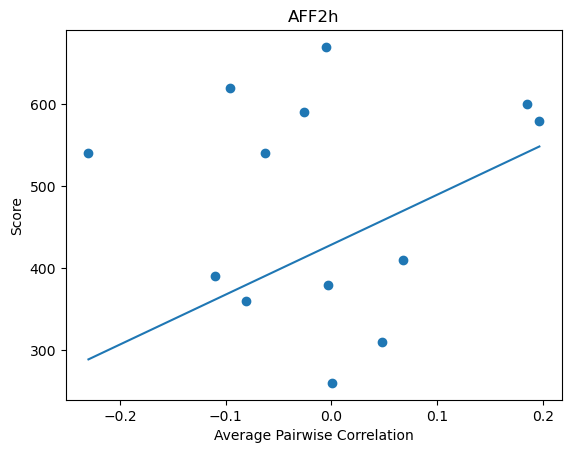

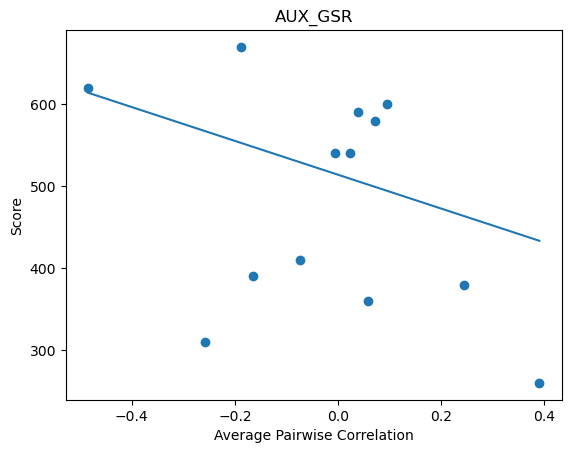

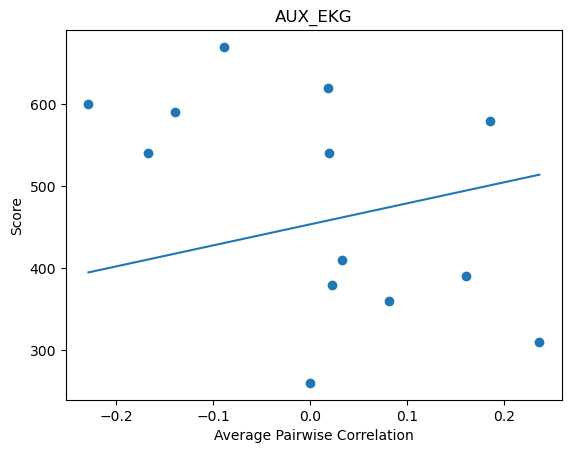

In [17]:
eeg_target_file = "minecraft_saturn_a_physio_task.csv"
eeg_correlation_output_json = f"{eeg_correlation_output_dir}/minecraft_saturn_a_correlation_absolute.json"
eeg_correlation_output_csv = f"{eeg_correlation_output_dir}/minecraft_saturn_a_correlation_absolute.csv"
eeg_correlation_output_image = f"{eeg_image_output_dir}/minecraft_saturn_a_absolute"
if not os.path.exists(eeg_correlation_output_image):
    os.makedirs(eeg_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        eeg_physio_task_dir,
        eeg_target_file,
        "score",
        EEG_CHANNELS,
        eeg_correlation_output_image,
        output_file_path=eeg_correlation_output_json,
        absolute_value_correlations=True,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(eeg_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)

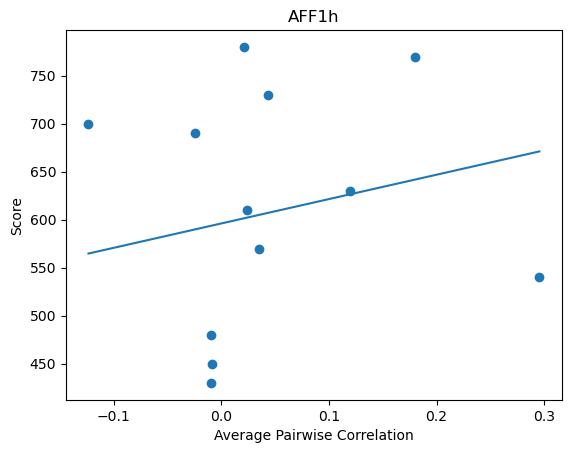

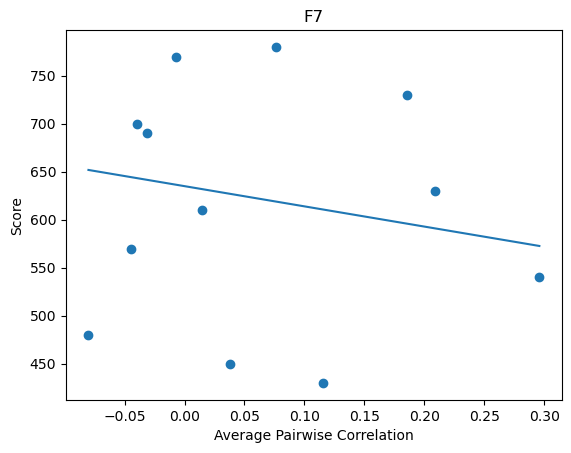

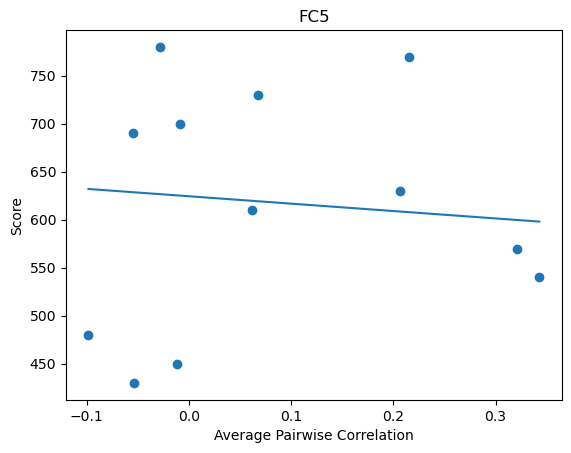

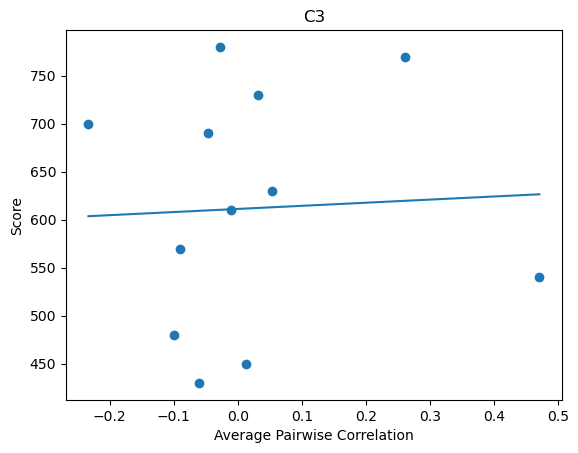

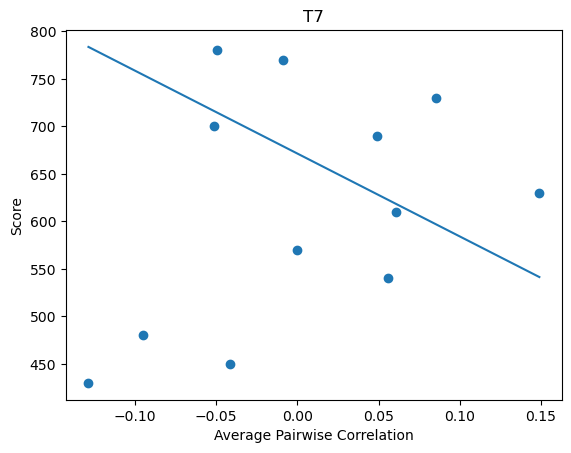

...

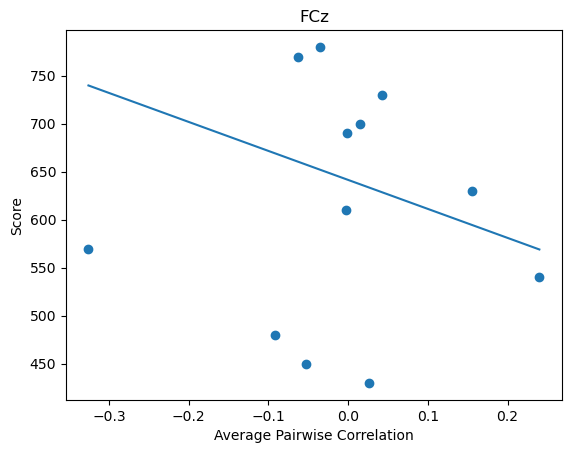

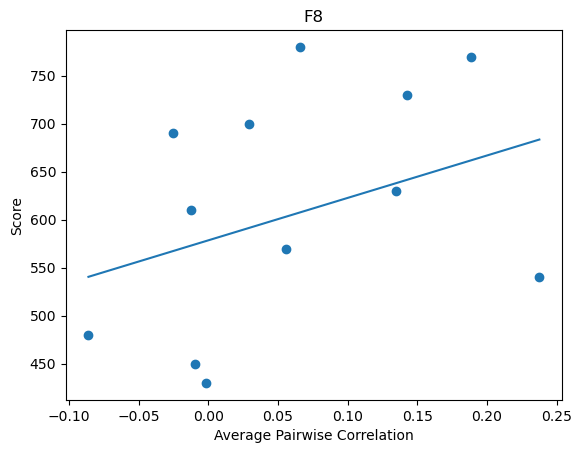

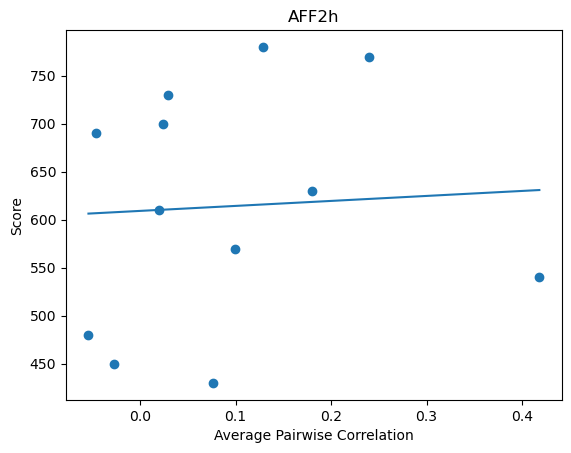

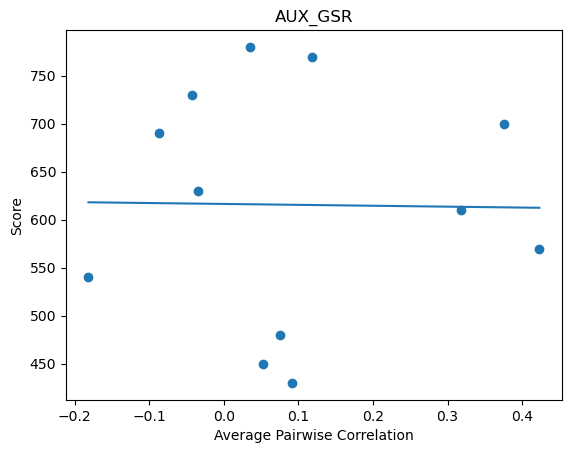

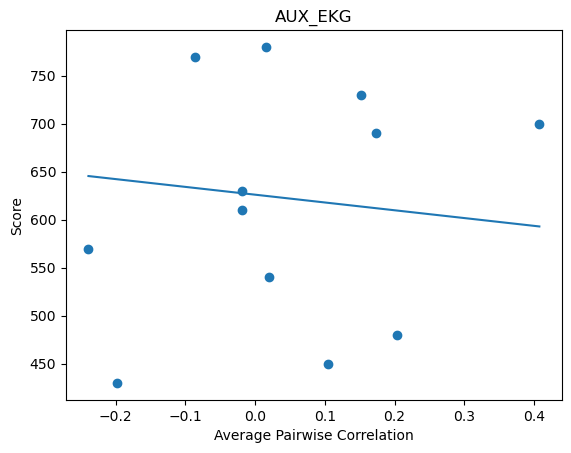

In [18]:
eeg_target_file = "minecraft_saturn_b_physio_task.csv"
eeg_correlation_output_json = f"{eeg_correlation_output_dir}/minecraft_saturn_b_correlation_absolute.json"
eeg_correlation_output_csv = f"{eeg_correlation_output_dir}/minecraft_saturn_b_correlation_absolute.csv"
eeg_correlation_output_image = f"{eeg_image_output_dir}/minecraft_saturn_b_absolute"
if not os.path.exists(eeg_correlation_output_image):
    os.makedirs(eeg_correlation_output_image)

predictions_per_channel, \
    rmse_per_channel, \
    linear_regressor_per_channel, \
    r2_per_channel, \
    null_model_r2, \
    linear_regression_slope_per_channel = \
    regression(
        eeg_physio_task_dir,
        eeg_target_file,
        "score",
        EEG_CHANNELS,
        eeg_correlation_output_image,
        output_file_path=eeg_correlation_output_json,
        absolute_value_correlations=True,
        blacklist_experiments=blacklist_experiments)

write_experiment_to_csv(eeg_correlation_output_csv,
                        rmse_per_channel,
                        r2_per_channel,
                        linear_regression_slope_per_channel)